In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2 as cv

### Introduction to LMS and NLMS

In this assignment, I was asked to repeat the work from Assignment 2, where I used the Least Mean Squares (LMS) algorithm on noisy data. Instead of simply redoing it, I decided to extend the work by exploring the Normalized Least Mean Squares (NLMS) algorithm. This allowed me to better understand their differences and compare their performance in different scenarios.

While LMS is a foundational adaptive filtering technique, it can face challenges when the input signal has large changes in amplitude. This is because LMS uses a fixed step size, which may lead to instability or slower learning when dealing with signals of varying amplitudes. NLMS solves this issue by adjusting the step size dynamically based on the power of the input signal, ensuring stability and faster learning.

To highlight these differences, I decided not to use the same data from Assignment 2, as it was carefully tuned for LMS. Instead, I created new data to clearly show where NLMS performs better. I combined sinusoidal signals, one with a very large amplitude and another with a smaller amplitude, to challenge LMS and observe how NLMS adapts more effectively. This setup allows us to analyze the key differences between the two algorithms and better understand when to use each.

After analyzing these differences with the new dataset, I will compare LMS and NLMS on denoising tasks for both the Assignment 2 image and a diagonal gradient image. This will allow us to assess their effectiveness in practical image denoising scenarios.

---

### LMS and NLMS: Formulas and Differences

#### **LMS Algorithm**
The LMS algorithm updates the filter weights to minimize the error between the desired output and the actual output. The update rule is:

**Weight update formula**:
$$
w(n+1) = w(n) + \mu \cdot e(n) \cdot u(n)
$$

Where:
- $w(n)$: Filter weights at step $n$
- $\mu$: Step size (learning rate)
- $e(n)$: Error signal, calculated as $d(n) - y(n)$, where $d(n)$ is the desired signal and $y(n)$ is the filter output
- $u(n)$: Input (noisy) signal

**Limitations of LMS**:
- The step size $\mu$ must be chosen carefully. A small $\mu$ results in slow learning, while a large $\mu$ can make the algorithm unstable.
- LMS is sensitive to the amplitude of $u(n)$. Large variations in $u(n)$ can cause unstable updates.

---

#### **NLMS Algorithm**
The NLMS algorithm improves upon LMS by normalizing the step size with the power of the input signal, making it less sensitive to changes in amplitude. This dynamic adjustment ensures stability and faster learning.

**Weight update formula**:
$$
w(n+1) = w(n) + \frac{\mu}{\|u(n)\|^2 + \epsilon} \cdot e(n) \cdot u(n)
$$

Where:
- $\|u(n)\|^2 = \sum u_i^2$: Power of the input signal
- $\epsilon$: Small positive constant to prevent division by zero
- Other terms are as defined in the LMS formula

**Advantages of NLMS**:
- The normalization term dynamically adjusts the step size, ensuring stability even with large input variations.
- Faster convergence compared to LMS when input amplitudes vary significantly.

---

### Key Differences Between LMS and NLMS

1. **Step Size Adjustment**:  
   - LMS uses a fixed step size ($\mu$), which can lead to instability or slow convergence if the step size is not carefully chosen.  
   - NLMS dynamically adjusts the step size based on the power of the input signal ($\|u(n)\|^2$), making it more adaptable to varying input amplitudes.

2. **Stability**:  
   - LMS is sensitive to large variations in the input signal amplitude, which can cause instability in the learning process.  
   - NLMS is more stable, as it normalizes the weight updates with respect to the signal power, preventing large jumps in weight adjustments.

3. **Convergence Speed**:  
   - LMS can converge slowly, especially when the input signal contains components with large amplitude variations.  
   - NLMS converges faster in such scenarios because the normalization ensures consistent and efficient updates.

4. **Computational Complexity**:  
   - LMS has a simpler computation process since it does not require calculation of the input signal's power.  
   - NLMS has slightly higher computational requirements due to the need to calculate $\|u(n)\|^2$ at each step, but this trade-off is justified by its improved performance.

---

### Motivation for New Dataset

To truly see the differences between LMS and NLMS, I chose to create a new dataset. Instead of reusing the examples from Assignment 2, which were tuned for LMS, I created a dataset where NLMS "kicks in." This dataset combines sinusoidal signals, one with a very large amplitude and another with a smaller amplitude. 

This setup creates a challenging situation for LMS, which may become unstable or slow to adapt. NLMS, however, can handle these variations effectively due to its normalization process. The goal is to analyze the performance of both algorithms on this dataset, focusing on key metrics like stability, convergence speed, and error minimization. By doing this, we can understand when to use LMS and when NLMS is the better choice.

In [3]:
def LMS(u, d, w, M, totSamples, miu):
    
    evec = np.zeros(totSamples)  # error vector
    error_changes = []  # error changes over iterations
    prev_error = np.inf  # previous total error

    for nn in range(M - 1, totSamples - 1):
        un = np.array(u[nn - M + 1: nn + 1][::-1])  # input window
        yn = np.dot(w[nn, :], un)  # filter output
        
        ee = d[nn] - yn  # calculate error
        evec[nn] = ee  # store error
        
        w[nn + 1, :] = w[nn, :] + miu * ee * un  # weight update
        
        current_error = np.sum(evec**2)  # total squared error
        error_change = abs(current_error - prev_error)  # error change
        error_changes.append(error_change)  # store error change
        prev_error = current_error  # update previous error

    return w, evec, error_changes  # return weights, error vector, and error changes

In [4]:
def NLMS(u, d, w, M, totSamples, miu, epsilon=1e-6):
    evec = np.zeros(totSamples)  # error vector
    error_changes = []  # error changes over iterations
    prev_error = np.inf  # previous total error

    for nn in range(M - 1, totSamples - 1):
        un = np.array(u[nn - M + 1: nn + 1][::-1])  # input window
        yn = np.dot(w[nn, :], un)  # filter output
        
        ee = d[nn] - yn  # calculate error
        evec[nn] = ee  # store error
        
        norm_factor = np.dot(un, un) + epsilon  # normalization factor
        w[nn + 1, :] = w[nn, :] + (miu / norm_factor) * ee * un  # weight update
        
        current_error = np.sum(evec**2)  # total squared error
        error_change = abs(current_error - prev_error)  # error change
        error_changes.append(error_change)  # store error change
        prev_error = current_error  # update previous error

    return w, evec, error_changes  # return weights, error vector, and error changes

In [5]:
def plot_lms_nlms_comparison(t, signal, noise, noisy_signal, filtered_signal_LMS, filtered_signal_NLMS, newW_LMS, newW_NLMS, LMSErr, NLMS_Err, error_changes_LMS, error_changes_NLMS, M, miu_LMS, miu_NLMS):
    # Error and weight evolution plots
    plt.figure(figsize=(20, 12))
    
    # Instantaneous Error Magnitude
    plt.subplot(4, 2, 1)
    plt.plot(abs(LMSErr), color='purple')
    plt.title(f"LMS: Instantaneous Error Magnitude (M={M}, miu={miu_LMS})")
    plt.xlabel("Iteration")
    plt.ylabel("Error Magnitude")
    plt.grid(True)
    
    plt.subplot(4, 2, 2)
    plt.plot(abs(NLMS_Err), color='blue')
    plt.title(f"NLMS: Instantaneous Error Magnitude (M={M}, miu={miu_NLMS})")
    plt.xlabel("Iteration")
    plt.ylabel("Error Magnitude")
    plt.grid(True)
    
    # Error Change Over Iterations
    plt.subplot(4, 2, 3)
    plt.plot(error_changes_LMS, color='purple')
    plt.title("LMS: Error Change Over Iterations")
    plt.xlabel("Iteration")
    plt.ylabel("Change in Error")
    plt.grid(True)
    
    plt.subplot(4, 2, 4)
    plt.plot(error_changes_NLMS, color='blue')
    plt.title("NLMS: Error Change Over Iterations")
    plt.xlabel("Iteration")
    plt.ylabel("Change in Error")
    plt.grid(True)
    
    # Weight Evolution
    plt.subplot(4, 2, 5)
    plt.plot(newW_LMS[:, M - 1], color='red', label=r'$W_{vec}$')  # LMS weights
    plt.axhline(y=1 / M, color='brown', linestyle='--', label=r'$1/M$')  # Reference line
    plt.title(f"LMS: Last Weight Evolution (M={M}, miu={miu_LMS})")
    plt.xlabel("Iterations")
    plt.ylabel(r"$W_{vec,i}$")
    plt.grid(True)
    plt.legend()
    
    plt.subplot(4, 2, 6)
    plt.plot(newW_NLMS[:, M - 1], color='blue', label=r'$W_{vec}$')  # NLMS weights
    plt.axhline(y=1 / M, color='brown', linestyle='--', label=r'$1/M$')  # Reference line
    plt.title(f"NLMS: Last Weight Evolution (M={M}, miu={miu_NLMS})")
    plt.xlabel("Iterations")
    plt.ylabel(r"$W_{vec,i}$")
    plt.grid(True)
    plt.legend()
    
    # All Weight Evolutions
    plt.subplot(4, 2, 7)
    for i in range(M):
        plt.plot(newW_LMS[:, i])
    plt.title("LMS: All Weight Evolutions")
    plt.xlabel("Iteration")
    plt.ylabel("Weight Values")
    plt.grid(True)
    
    plt.subplot(4, 2, 8)
    for i in range(M):
        plt.plot(newW_NLMS[:, i])
    plt.title("NLMS: All Weight Evolutions")
    plt.xlabel("Iteration")
    plt.ylabel("Weight Values")
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

    # Signal comparison plots
    plt.figure(figsize=(12, 12))
    
    # Original signal
    plt.subplot(6, 1, 1)
    plt.plot(t, signal, color='blue', label='Original Signal')
    plt.title("Original Signal")
    plt.grid(True)
    
    # Noisy signal
    plt.subplot(6, 1, 2)
    plt.plot(t, noisy_signal, color='red', alpha=0.7, label='Noisy Signal')
    plt.title("Noisy Signal")
    plt.grid(True)
    
    # Original vs LMS filtered signal
    plt.subplot(6, 1, 3)
    plt.plot(t, signal, label='Original Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_LMS, label='LMS Filtered Signal', color='green', alpha=0.8)
    plt.title("LMS: Original vs Filtered Signal")
    plt.grid(True)
    plt.legend()
    
    # Original vs NLMS filtered signal
    plt.subplot(6, 1, 4)
    plt.plot(t, signal, label='Original Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_NLMS, label='NLMS Filtered Signal', color='purple', alpha=0.8)
    plt.title("NLMS: Original vs Filtered Signal")
    plt.grid(True)
    plt.legend()
    
    # Noisy vs LMS filtered signal
    plt.subplot(6, 1, 5)
    plt.plot(t, noisy_signal, label='Noisy Signal', color='red', alpha=0.7)
    plt.plot(t, filtered_signal_LMS, label='LMS Filtered Signal', color='green', alpha=0.7)
    plt.title("LMS: Noisy vs Filtered Signal")
    plt.grid(True)
    plt.legend()
    
    # Noisy vs NLMS filtered signal
    plt.subplot(6, 1, 6)
    plt.plot(t, noisy_signal, label='Noisy Signal', color='red', alpha=0.7)
    plt.plot(t, filtered_signal_NLMS, label='NLMS Filtered Signal', color='purple', alpha=0.7)
    plt.title("NLMS: Noisy vs Filtered Signal")
    plt.grid(True)
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Zoomed comparison: LMS and NLMS
    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 2, 1)
    plt.plot(t, signal, label='Original Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_LMS, label='LMS Filtered Signal', color='green', alpha=0.8)
    plt.xlim(3.5, 4.5)
    plt.title("LMS: Original vs Filtered Signal (Zoomed)")
    plt.grid(True)
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(t, signal, label='Original Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_NLMS, label='NLMS Filtered Signal', color='purple', alpha=0.8)
    plt.xlim(3.5, 4.5)
    plt.title("NLMS: Original vs Filtered Signal (Zoomed)")
    plt.grid(True)
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(t, noisy_signal, label='Noisy Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_LMS, label='LMS Filtered Signal', color='purple', alpha=0.8)
    plt.xlim(3.5, 4.5)
    plt.title("LMS: Noisy vs Filtered Signal (Zoomed)")
    plt.grid(True)
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(t, noisy_signal, label='Noisy Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_NLMS, label='NLMS Filtered Signal', color='purple', alpha=0.8)
    plt.xlim(3.5, 4.5)
    plt.title("NLMS: Noisy vs Filtered Signal (Zoomed)")
    plt.grid(True)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

In [6]:
def run_lms_nlms_comparison(signal, t, M, miu_LMS, miu_NLMS, noise_level, epsilon=1e-6):
    noise = np.random.normal(0, noise_level, len(t))  # generate noise
    noisy_signal = signal + noise  # add noise to the signal

    totSamples = len(noisy_signal)
    w_LMS = np.zeros((totSamples, M))  # LMS weights
    w_NLMS = np.zeros((totSamples, M))  # NLMS weights

    d = signal  # desired signal
    u = noisy_signal  # input signal (noisy)

    newW_LMS, LMSErr, error_changes_LMS = LMS(u, d, w_LMS, M, totSamples, miu_LMS)  # apply LMS
    filtered_signal_LMS = np.zeros_like(u)  # initialize LMS filtered signal
    for i in range(M, totSamples):
        filtered_signal_LMS[i] = np.dot(newW_LMS[-1, :], u[i - M + 1: i + 1][::-1])  # LMS output

    newW_NLMS, NLMS_Err, error_changes_NLMS = NLMS(u, d, w_NLMS, M, totSamples, miu_NLMS, epsilon)  # apply NLMS
    filtered_signal_NLMS = np.zeros_like(u)  # initialize NLMS filtered signal
    for i in range(M, totSamples):
        filtered_signal_NLMS[i] = np.dot(newW_NLMS[-1, :], u[i - M + 1: i + 1][::-1])  # NLMS output

    plot_lms_nlms_comparison(  # visualize results
        t=t,
        signal=signal,
        noise=noise,
        noisy_signal=noisy_signal,
        filtered_signal_LMS=filtered_signal_LMS,
        filtered_signal_NLMS=filtered_signal_NLMS,
        newW_LMS=newW_LMS,
        newW_NLMS=newW_NLMS,
        LMSErr=LMSErr,
        NLMS_Err=NLMS_Err,
        error_changes_LMS=error_changes_LMS,
        error_changes_NLMS=error_changes_NLMS,
        M=M,
        miu_LMS=miu_LMS,
        miu_NLMS=miu_NLMS
    )

### Example: Using LMS and NLMS on the Signal from Assignment 2

In this example, we use the same signal setup from Assignment 2. The signal is a combination of sinusoidal components with added Gaussian noise. We apply both the **LMS** and **NLMS** algorithms on this noisy signal to filter it and compare their performances. 

The procedure includes:
1. Generating the original signal and adding Gaussian noise.
2. Applying both LMS and NLMS algorithms to the noisy signal.
3. Visualizing the results to compare the filtered signals and error behaviors.

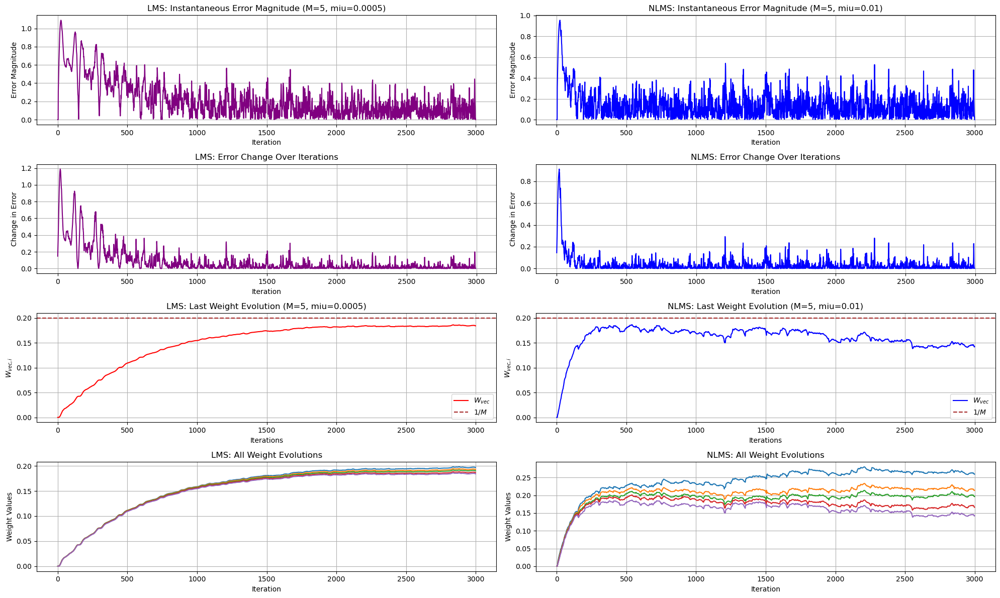

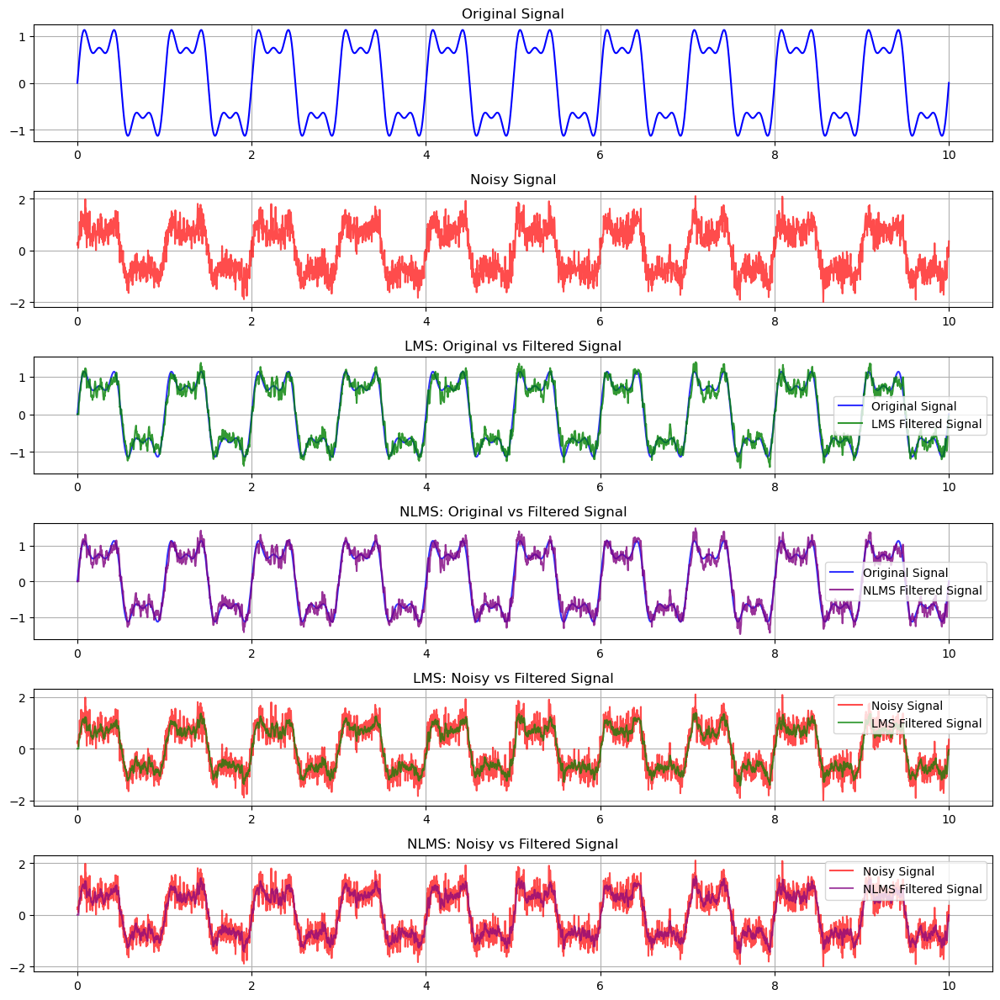

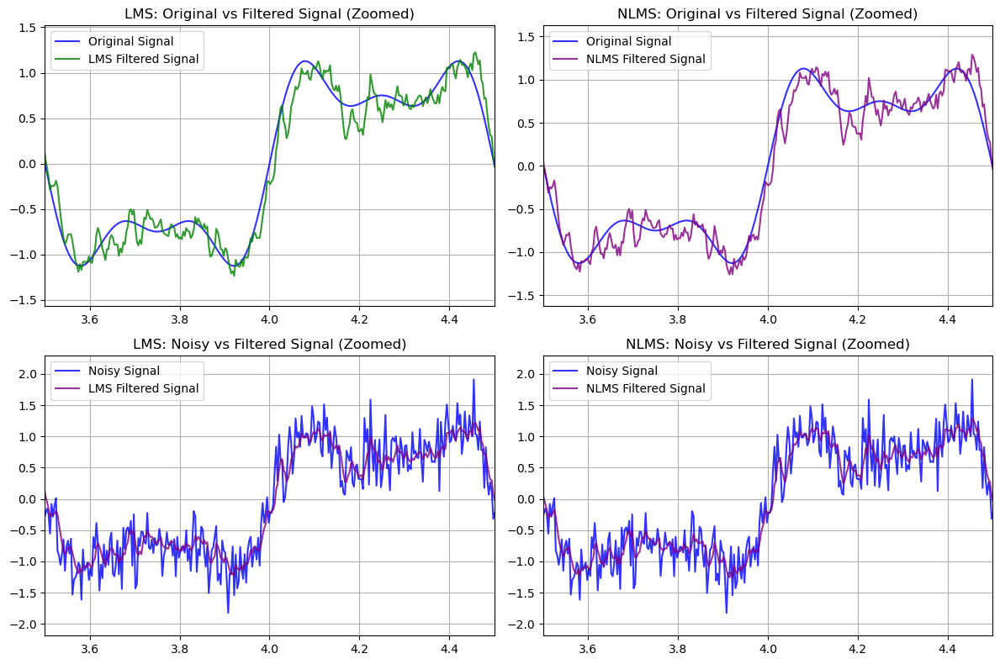

In [8]:
t = np.linspace(0, 10, 3000)  # time vector
signal = (np.sin(2 * np.pi * t) + 
          0.5 * np.sin(2 * np.pi * 3 * t) + 
          0.25 * np.sin(2 * np.pi * 5 * t))  # composite sinusoidal signal

# parameters
M = 5  # number of filter coefficients
miu_LMS = 5e-4  # step size for LMS
miu_NLMS = 0.01  # step size for NLMS
noise_level = 0.3  # noise standard deviation

# run LMS and NLMS comparison
run_lms_nlms_comparison(signal, t, M, miu_LMS, miu_NLMS, noise_level)

### Analysis of LMS and NLMS Performance

#### **1. Error Convergence Behavior**
- **LMS**:
  - The error gradually decreases over iterations, showing steady convergence.
  - Final error stabilizes with small fluctuations due to sensitivity to noise.

- **NLMS**:
  - Converges faster than LMS with a sharp initial error reduction.
  - Achieves a slightly lower final error magnitude, showing better noise adaptation.

#### **2. Weight Evolution**
- **LMS**:
  - Weights evolve gradually and stabilize near $1/M$.
  - The process is slower but steady.

- **NLMS**:
  - Weights converge faster with an initially sharp adjustment phase.
  - Slight fluctuations are observed in the final stabilized weights, possibly due to the chosen step size.

#### **3. Signal Filtering Performance**
- **LMS**:
  - Filtered signal follows the original signal but retains some noise artifacts.
  - Noise reduction is effective but less smooth compared to NLMS.

- **NLMS**:
  - Filtered signal closely matches the original signal with better noise suppression.
  - Handles rapid transitions more effectively.

### Observations
1. Different step sizes were used for LMS ($\mu = 5 \times 10^{-4}$) and NLMS ($\mu = 0.01$).
2. NLMS shows better performance in terms of noise suppression and convergence speed compared to LMS.

### Next Steps
- Explore the impact of using the same step size for LMS and NLMS to analyze their behavior under identical conditions.

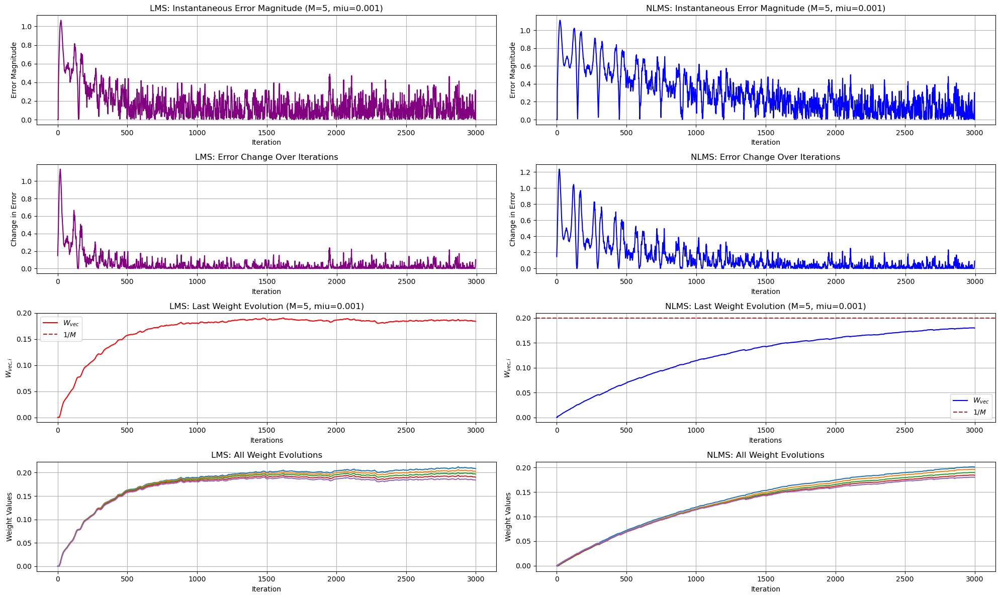

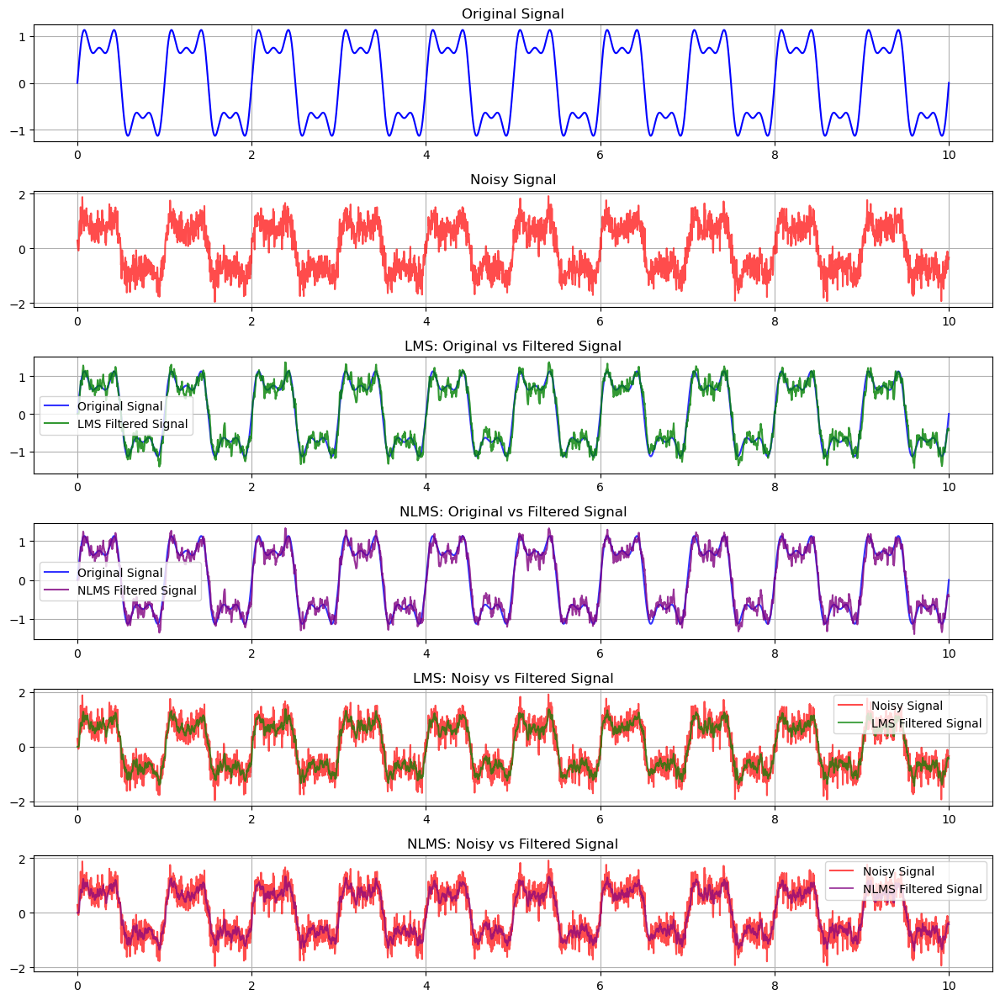

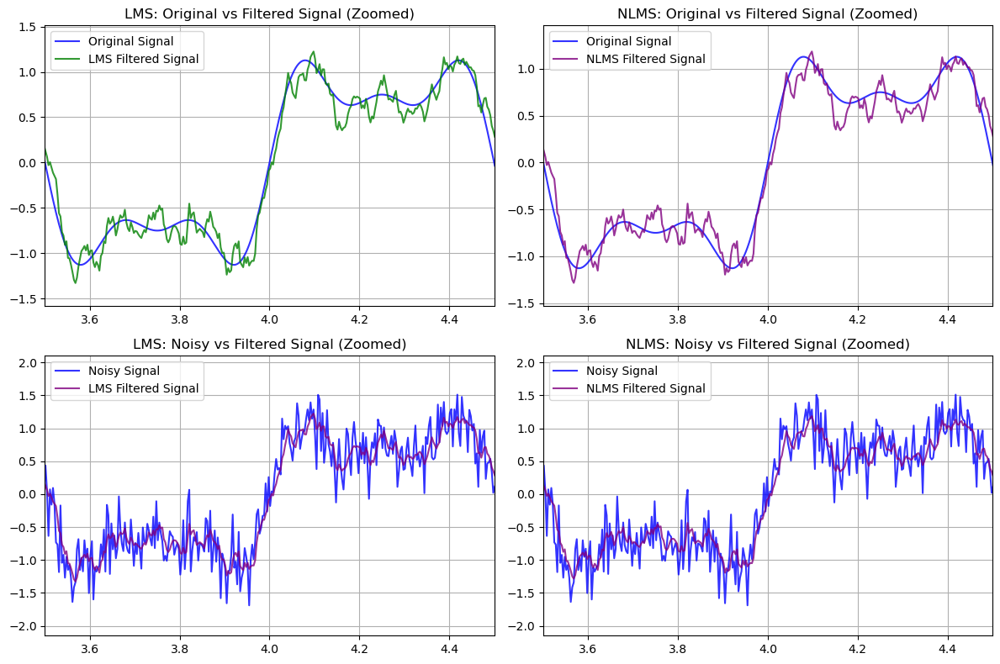

In [10]:
t = np.linspace(0, 10, 3000)  # time vector
signal = (np.sin(2 * np.pi * t) + 
          0.5 * np.sin(2 * np.pi * 3 * t) + 
          0.25 * np.sin(2 * np.pi * 5 * t))  # composite sinusoidal signal

# parameters
M = 5  # number of filter coefficients
miu_LMS = 1e-3  # step size for LMS
miu_NLMS = 1e-3  # step size for NLMS
noise_level = 0.3  # noise standard deviation

run_lms_nlms_comparison(signal, t, M, miu_LMS, miu_NLMS, noise_level)  # compare LMS and NLMS

### Analysis of LMS and NLMS Performance with Same Step Size ($\mu = 0.001$)

#### Instantaneous Error Magnitude
- NLMS reduces the error more **slowly** than LMS.
- This happens because NLMS adjusts its updates based on the signal’s energy, making the updates smaller and slower for low-energy signals.

#### Error Change Over Iterations
- NLMS shows **slower error reduction** compared to LMS.
- This is again due to normalization, which reduces the effective update size when the signal energy is low.

#### Last Weight Evolution
- The weights in NLMS take **longer to converge** compared to LMS because its updates are smaller due to normalization.

#### All Weight Evolutions
- NLMS adjusts weights more **gradually** than LMS, owing to its dynamic normalization.

---

### Conclusion
For low-energy signals, NLMS with the same step size as LMS ($\mu = 0.001$) converges slower and adapts weights more gradually. This is because NLMS normalizes its updates based on the signal energy, effectively reducing the step size when the energy is low. To achieve better performance with NLMS, a **larger step size** is required to compensate for the normalization effect, which helps improve convergence speed and performance.

---

### Updated Next Step
In the next step, we tested the performance of **LMS and NLMS** on a signal with **prominent amplitude variations**:
- A very high amplitude sinusoid ($100 \cdot \sin(2 \pi t)$), challenging LMS's stability and NLMS's adaptability.
- A very low amplitude sinusoid ($0.05 \cdot \sin(2 \pi \cdot 50 \cdot t)$), requiring fine-grained adaptation to small energy levels.

To further emphasize the challenge, we added high noise ($\text{noise\_level} = 15$) to the signal. The parameters were:
- $M = 5$ (filter coefficients),
- $\mu_{\text{LMS}} = 5 \times 10^{-5}$ (small step size for LMS to maintain stability),
- $\mu_{\text{NLMS}} = 0.01$ (moderate step size to leverage normalization).

This scenario highlights NLMS's ability to dynamically adapt to varying signal energy levels and maintain stability in high-noise conditions, showcasing its strengths over LMS.

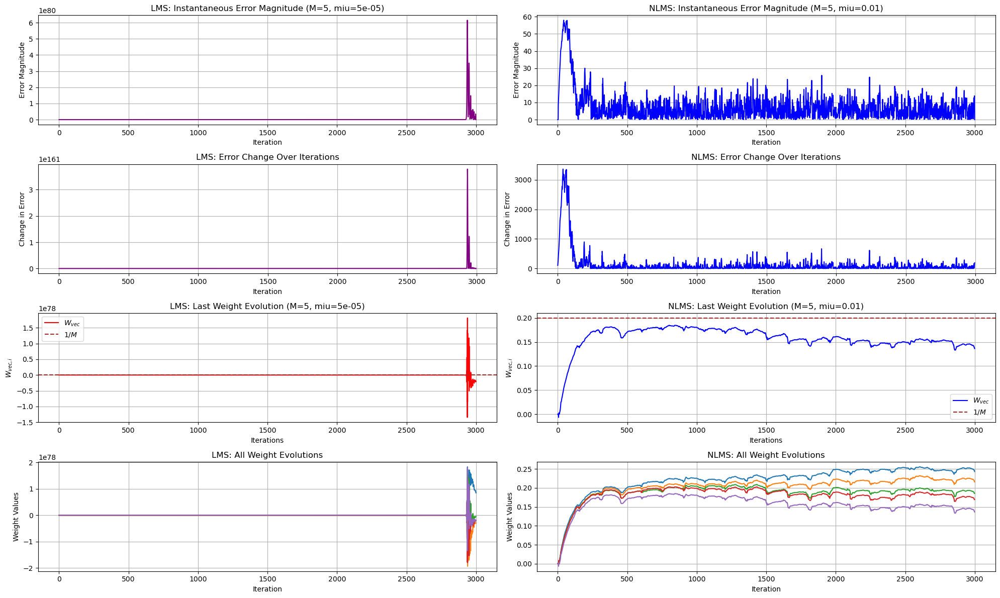

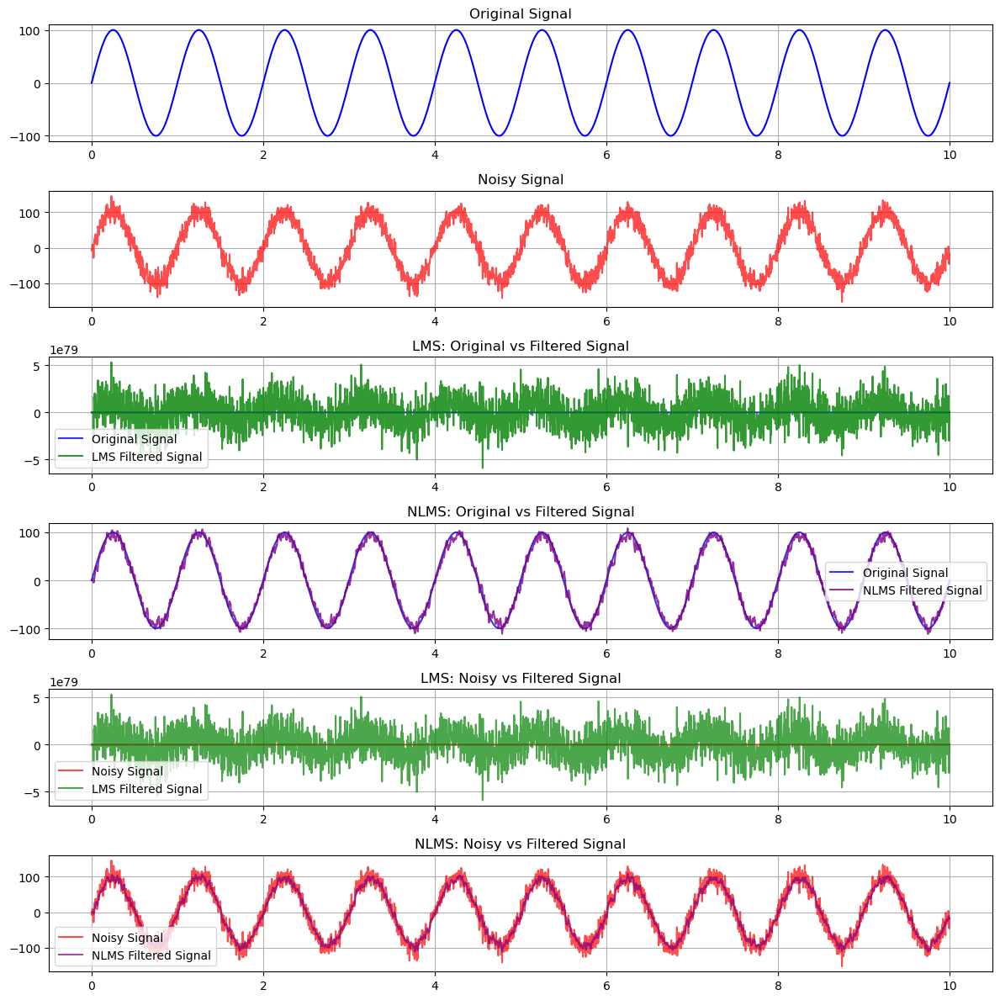

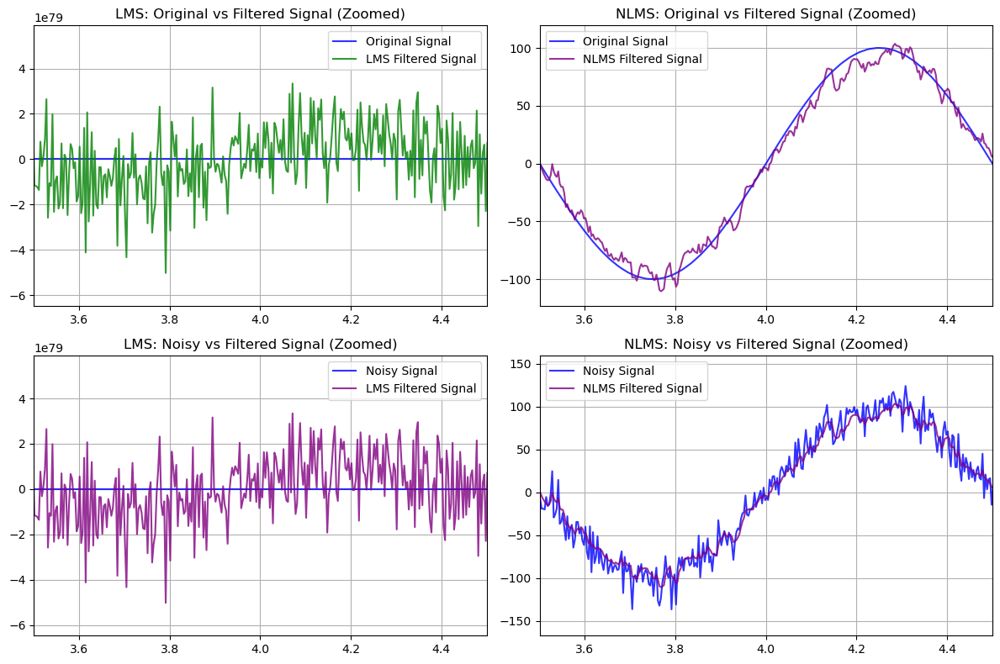

In [12]:
# generate a signal with prominent amplitude variations
t = np.linspace(0, 10, 3000)  # time vector
signal = (100 * np.sin(2 * np.pi * t) +        # high amplitude sinusoid
          0.05 * np.sin(2 * np.pi * 50 * t))  # low amplitude sinusoid

# parameters
M = 5  # number of filter coefficients
miu_LMS = 5e-5  # small step size for LMS (stability with high amplitude)
miu_NLMS = 0.01  # moderate step size for NLMS (adaptive normalization)
noise_level = 15  # high noise level to test filtering performance

run_lms_nlms_comparison(signal, t, M, miu_LMS, miu_NLMS, noise_level)  # compare LMS and NLMS

### **Analysis of LMS and NLMS on a Signal with High Amplitude and Noise**

#### **Instantaneous Error Magnitude**:
- **LMS**: The error diverges to infinity due to instability with the chosen step size ($\mu = 5 \times 10^{-5}$).
- **NLMS**: The error reduces smoothly and stabilizes, showing robustness against high amplitude and noise.

#### **Filtered Signal**:
- **LMS**: The output diverges and becomes completely unusable.
- **NLMS**: The filtered signal closely matches the original signal, effectively handling the noise and large amplitude variations.

#### **Conclusion**:
- LMS fails with the current step size. A smaller step size (e.g., $\mu = 5 \times 10^{-6}$) could stabilize it, but this would significantly slow down convergence.
- NLMS does not require manual tuning and adapts dynamically to varying signal energy, making it more robust and reliable.

---

### **Next Step**:
We will test LMS with a smaller step size ($\mu = 5 \times 10^{-6}$) to stabilize its performance and compare it with NLMS. This will demonstrate the trade-off in LMS between stability and convergence speed and reinforce NLMS's advantage in adaptability.

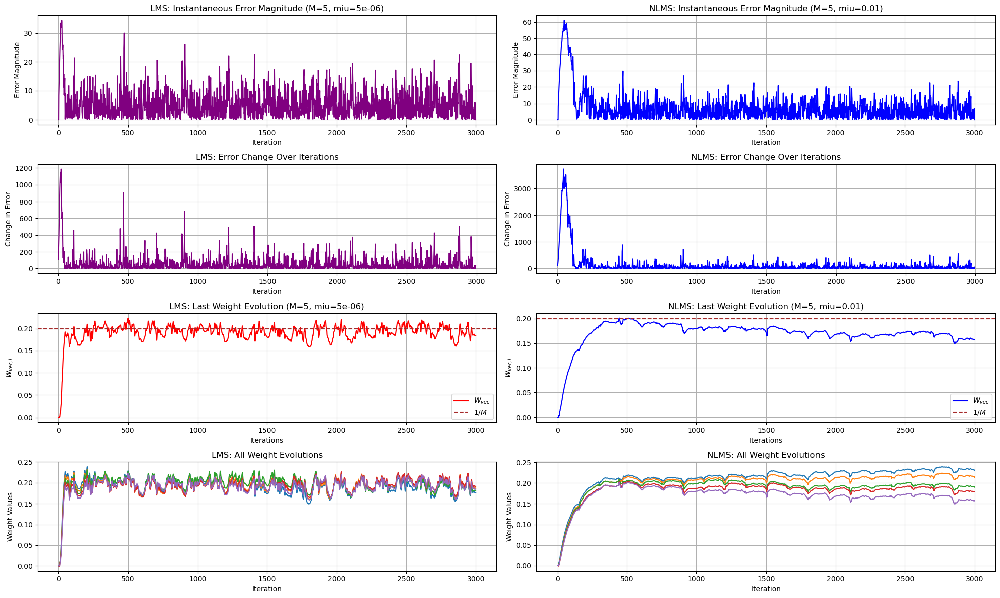

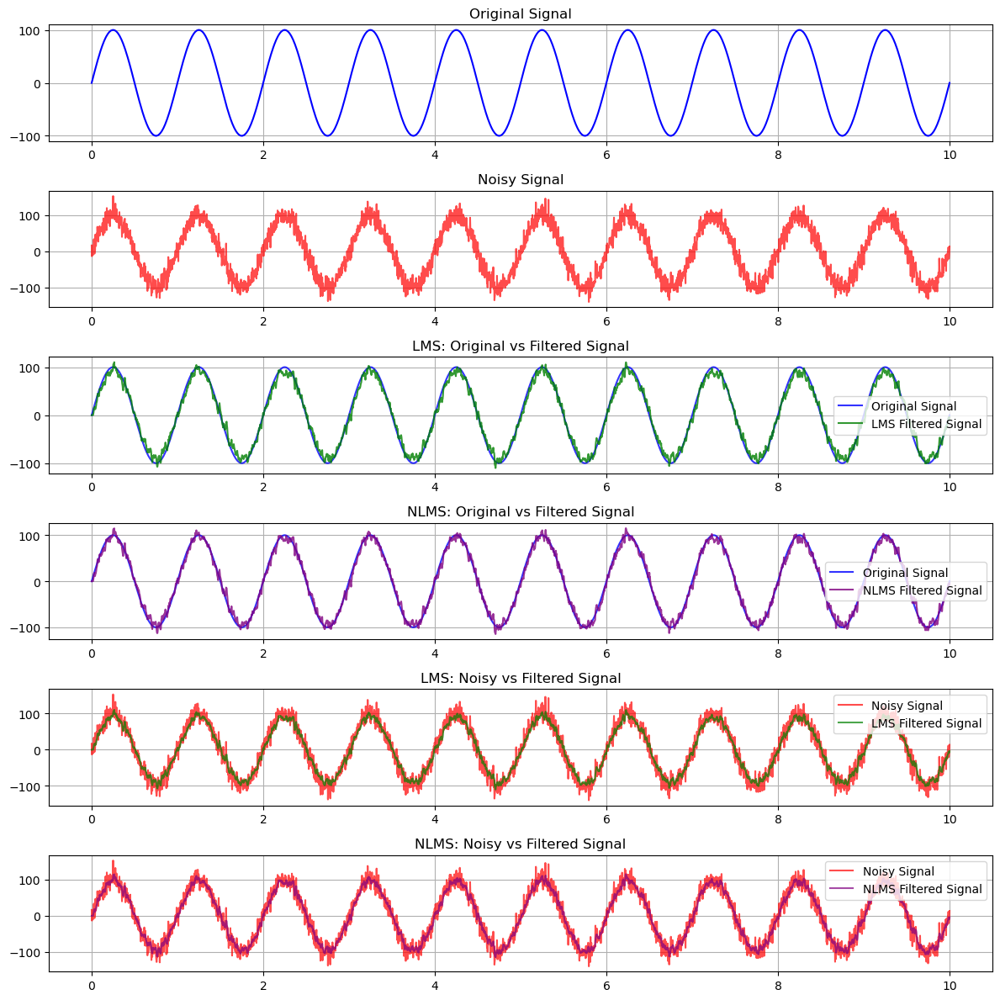

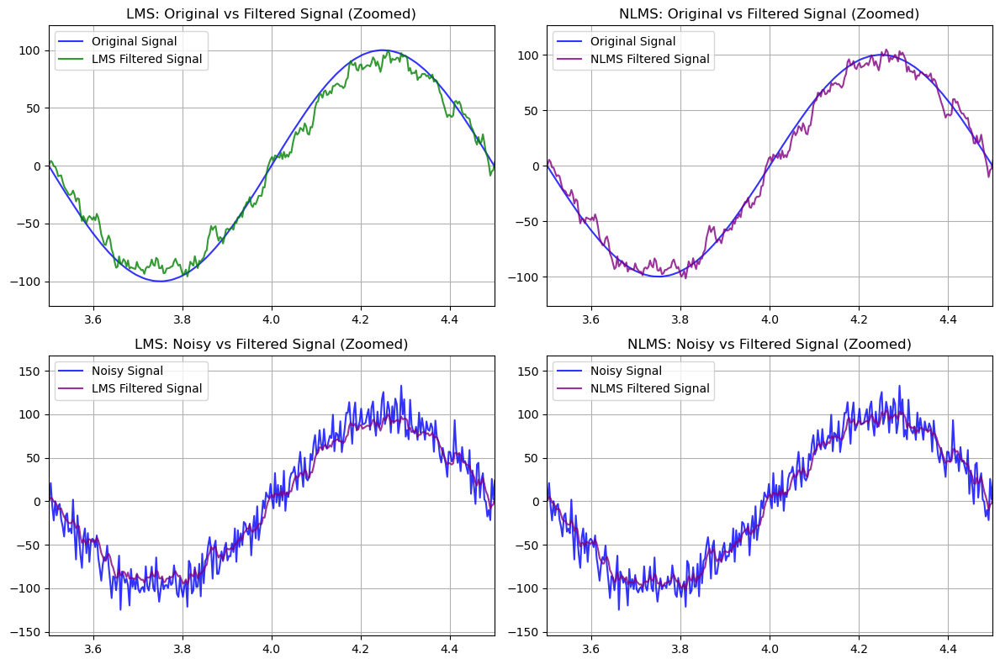

In [14]:
# generate a signal with prominent amplitude variations
t = np.linspace(0, 10, 3000)  # time vector
signal = (100 * np.sin(2 * np.pi * t) +         # high amplitude sinusoid
          0.05 * np.sin(2 * np.pi * 50 * t))    # low amplitude sinusoid

# parameters
M = 5  # number of filter coefficients
miu_LMS = 5e-6  # small step size for LMS (stability with high amplitude)
miu_NLMS = 0.01  # moderate step size for NLMS (adaptive normalization)
noise_level = 15  # high noise level to test filtering performance

run_lms_nlms_comparison(signal, t, M, miu_LMS, miu_NLMS, noise_level)  # compare LMS and NLMS

### Analysis of LMS with Manual Tuning

As we can see from the results of the previous example:
- **LMS**: By manually tuning the step size to $\mu = 5 \times 10^{-6}$, LMS was able to handle the high-amplitude signal and produced stable, accurate results. This demonstrates that LMS can perform well with appropriate tuning, but it requires significant manual adjustment for different signals and noise levels.
- **NLMS**: NLMS continued to perform well without requiring tuning, showing its adaptability and robustness. However, we have observed that NLMS generally performs better for gradual changes in signal characteristics.

---

### Next Step: Testing Abrupt Amplitude Transitions

In the next step, we will test both LMS and NLMS on a signal with **abrupt amplitude transitions**. This scenario is designed to highlight the limitations of NLMS's normalization mechanism when faced with sudden changes in signal energy. LMS, despite requiring manual tuning, might handle these transitions better.

The signal will consist of:
1. **High amplitude**: $100 \cdot \sin(2 \pi t)$ for $t < 3$.
2. **Medium amplitude**: $0.5 \cdot \sin(2 \pi t)$ for $3 \leq t < 7$.
3. **Low amplitude**: $0.01 \cdot \sin(2 \pi \cdot 50 \cdot t)$ for $t \geq 7$.

This example will allow us to further evaluate the strengths and weaknesses of LMS and NLMS in handling dynamic signal changes.

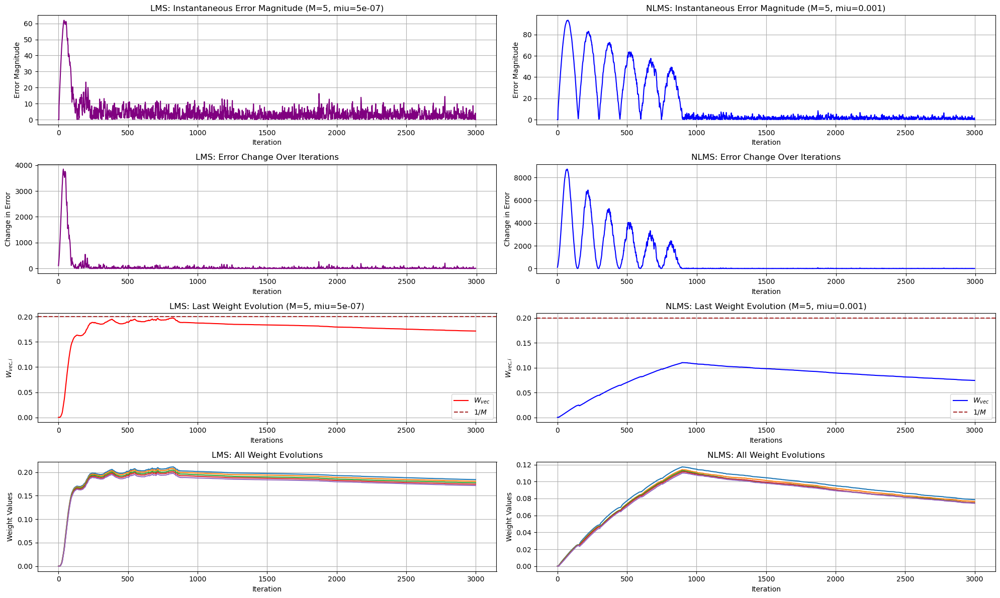

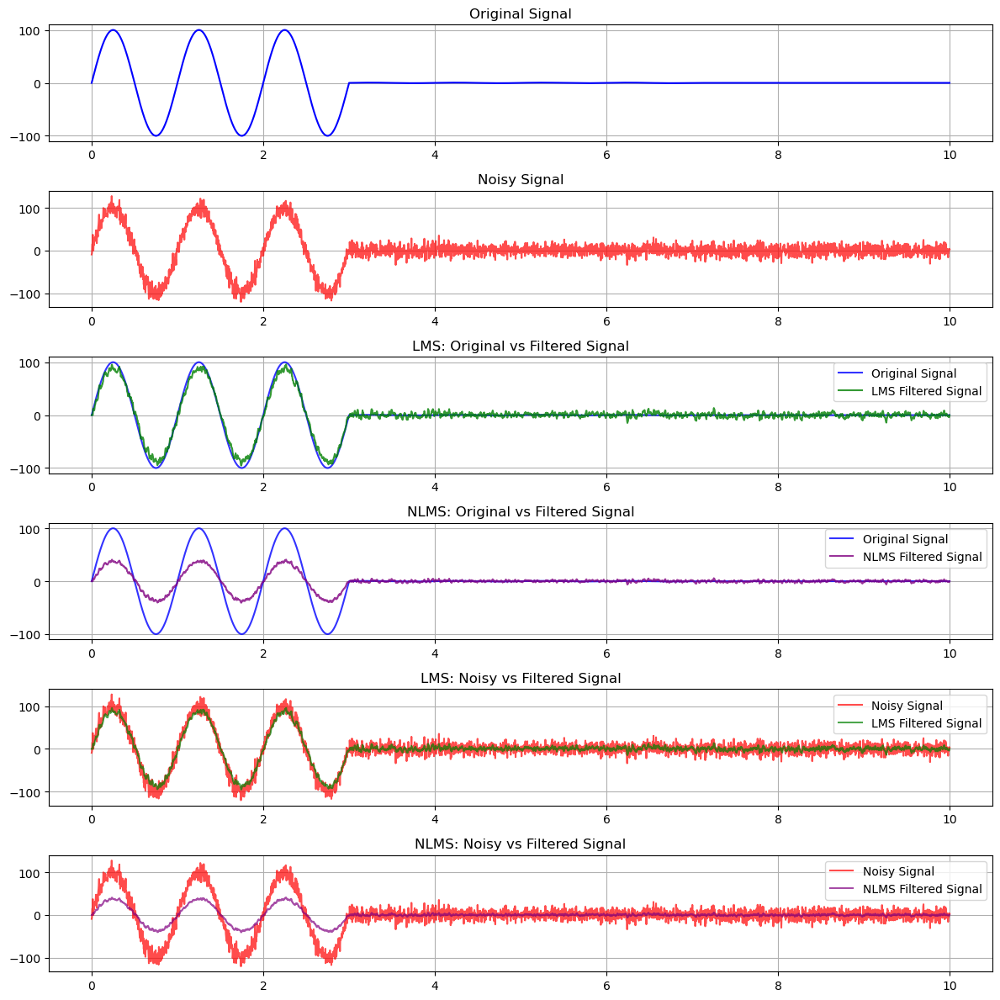

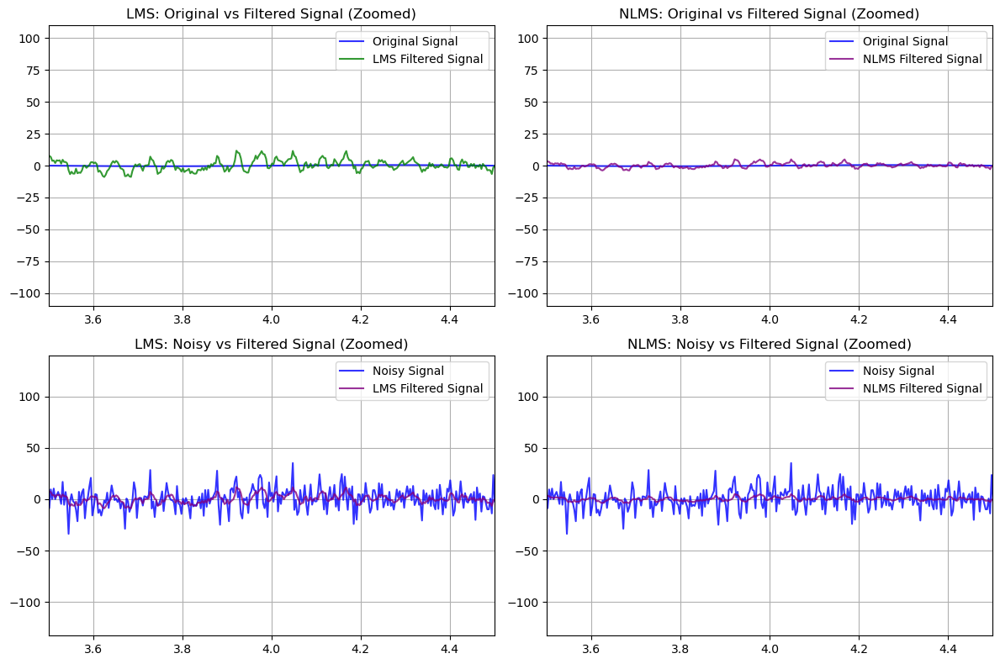

In [16]:
# generate a piecewise signal with abrupt energy changes
t = np.linspace(0, 10, 3000)  # time vector
signal = np.piecewise(t, 
                      [t < 3, (t >= 3) & (t < 7), t >= 7], 
                      [lambda t: 100 * np.sin(2 * np.pi * t),  # high amplitude
                       lambda t: 0.5 * np.sin(2 * np.pi * t),  # medium amplitude
                       lambda t: 0.01 * np.sin(2 * np.pi * 50 * t)])  # low amplitude

# parameters
M = 5  # number of filter coefficients
miu_LMS = 5e-7  # step size for LMS (tuned for stability)
miu_NLMS = 0.001  # step size for NLMS (adaptive normalization)
noise_level = 10  # high noise level to evaluate filtering

run_lms_nlms_comparison(signal, t, M, miu_LMS, miu_NLMS, noise_level)  # compare LMS and NLMS

### **Analysis of LMS and NLMS on Abrupt Amplitude Transitions**

#### **Observations**
1. **LMS Performance**:
   - LMS, with a manually tuned step size ($\mu = 5 \times 10^{-7}$), effectively handled the abrupt amplitude transitions.
   - The filtered signal closely followed the original signal across all regions, and the error reduced steadily over iterations.
   - Weight updates were stable and converged reliably.

2. **NLMS Performance**:
   - NLMS failed to produce accurate results, even after extensive tuning of the step size ($\mu_{\text{NLMS}}$ tested from 0.1 to $1 \times 10^{-5}$).
   - The filtered signal deviated significantly, especially in regions with abrupt transitions and low amplitudes.
   - Weight updates were erratic, and convergence was not achieved.

#### **Why Does NLMS Fail?**
- NLMS’s normalization mechanism struggles with abrupt amplitude transitions:
  - Large variations in the signal’s energy lead to inconsistent normalization and unstable weight updates.
  - In low-amplitude regions, the normalization factor becomes too small, causing negligible or ineffective updates.

---

### **Conclusion**
LMS, with appropriate manual tuning, demonstrated stable performance in handling abrupt amplitude transitions. In contrast, NLMS could not adapt effectively to such scenarios, highlighting its limitations in cases with sudden and extreme energy changes.

---

### **Next Step**
The next step is to evaluate the **computational complexity** of LMS and NLMS. Using our **first example signal**, we will compare the number of operations required for each algorithm and analyze the trade-offs between computational cost and filtering performance. This analysis will help us understand how the runtime of each algorithm scales with the complexity of the filter and the differences in computational efficiency between LMS and NLMS.

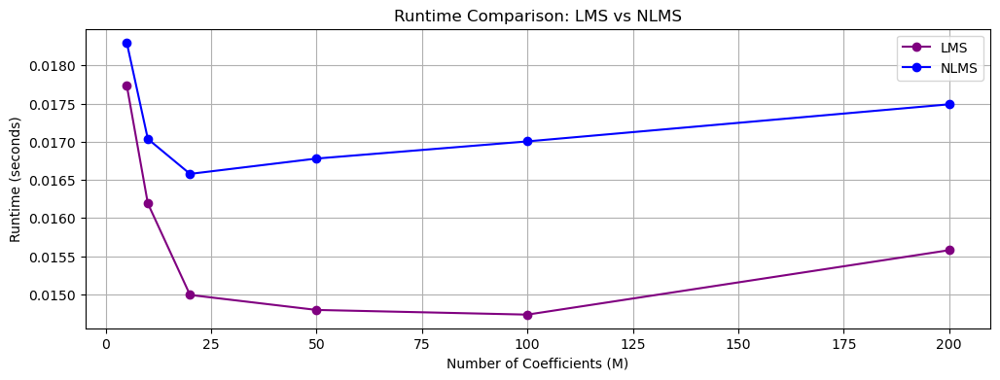

In [18]:
# generate the signal
t = np.linspace(0, 10, 3000)  # time vector
signal = (np.sin(2 * np.pi * t) +         # primary sinusoid
          0.5 * np.sin(2 * np.pi * 3 * t) +  # secondary sinusoid
          0.25 * np.sin(2 * np.pi * 5 * t))  # tertiary sinusoid

# parameters
miu_LMS = 5e-4  # step size for LMS
miu_NLMS = 0.01  # step size for NLMS
noise_level = 0.3  # noise standard deviation

# define noise and noisy signal
noise = np.random.normal(0, noise_level, len(t))  # gaussian noise
noisy_signal = signal + noise  # add noise to signal

# desired and input signals
d = signal  # desired signal
u = noisy_signal  # input signal (noisy)

# evaluate runtime for different filter coefficients (M)
M_values = [5, 10, 20, 50, 100, 200]  # different M values
lms_times = []  # store LMS runtimes
nlms_times = []  # store NLMS runtimes

# measure runtime for LMS and NLMS
for M in M_values:
    totSamples = len(noisy_signal)  # total samples
    w_LMS = np.zeros((totSamples, M))  # initialize LMS weights
    w_NLMS = np.zeros((totSamples, M))  # initialize NLMS weights

    # measure LMS runtime
    start_time = time.time()  # start timer
    newW_LMS, _, _ = LMS(u, d, w_LMS, M, totSamples, miu_LMS)  # apply LMS
    lms_times.append(time.time() - start_time)  # record runtime

    # measure NLMS runtime
    start_time = time.time()  # start timer
    newW_NLMS, _, _ = NLMS(u, d, w_NLMS, M, totSamples, miu_NLMS)  # apply NLMS
    nlms_times.append(time.time() - start_time)  # record runtime

# plot runtime comparison
plt.figure(figsize=(12, 4))
plt.plot(M_values, lms_times, label="LMS", marker='o', color='purple')  # LMS runtime
plt.plot(M_values, nlms_times, label="NLMS", marker='o', color='blue')  # NLMS runtime
plt.xlabel("Number of Coefficients (M)")
plt.ylabel("Runtime (seconds)")
plt.title("Runtime Comparison: LMS vs NLMS")
plt.legend()
plt.grid(True)
plt.show()

### **Analysis**

- **LMS Runtime**: The runtime of LMS remains consistently lower than NLMS across all filter sizes. This is because LMS has a simpler computation process without requiring normalization.

- **NLMS Runtime**: NLMS demonstrates a higher computational cost as the number of filter coefficients $(M$) increases. This is due to the additional step of computing normalization based on the signal's power at each iteration.

- **Trend**: Both LMS and NLMS show an increase in runtime as $M$ increases, but NLMS’s runtime grows at a slightly faster rate compared to LMS. 

### **Conclusion**
LMS is computationally more efficient than NLMS, making it suitable for applications where computational resources are limited. However, this efficiency comes at the cost of manual tuning for stability and performance. NLMS, while computationally more demanding, is robust to variations in signal amplitude and does not require step size tuning.

### **Next Step**
The next step is to **evaluate filtering accuracy** by comparing the error convergence behavior of LMS and NLMS over varying numbers of filter coefficients $(M$). This will help analyze how runtime and computational cost trade off against filtering performance.

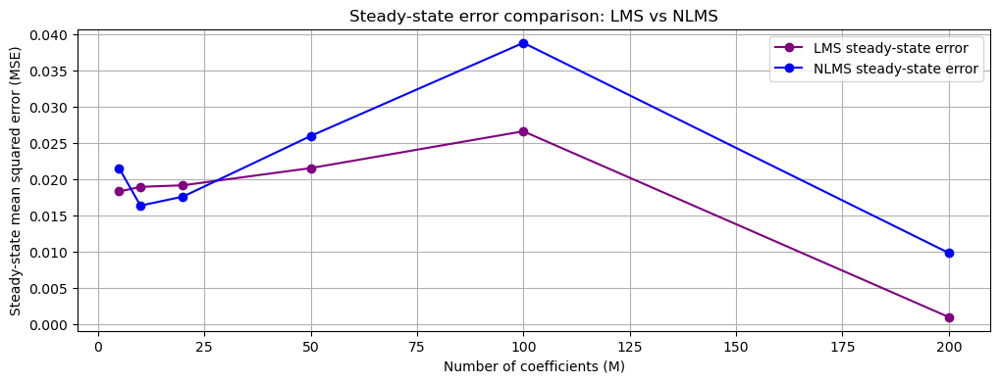

In [20]:
# generate the signal
t = np.linspace(0, 10, 3000)  # time vector
signal = (np.sin(2 * np.pi * t) +         # primary sinusoid
          0.5 * np.sin(2 * np.pi * 3 * t) +  # secondary sinusoid
          0.25 * np.sin(2 * np.pi * 5 * t))  # tertiary sinusoid

# parameters
miu_LMS = 5e-4  # step size for LMS
miu_NLMS = 0.01  # step size for NLMS
noise_level = 0.3  # noise standard deviation

# define noise and noisy signal
noise = np.random.normal(0, noise_level, len(t))  # gaussian noise
noisy_signal = signal + noise  # add noise to signal

# desired and input signals
d = signal  # desired signal
u = noisy_signal  # input signal (noisy)

# evaluate steady-state error for different filter coefficients (M)
M_values = [5, 10, 20, 50, 100, 200]  # different M values
steady_state_errors_lms = []  # store LMS steady-state errors
steady_state_errors_nlms = []  # store NLMS steady-state errors

# measure steady-state errors for LMS and NLMS
for M in M_values:
    totSamples = len(noisy_signal)  # total samples
    w_LMS = np.zeros((totSamples, M))  # initialize LMS weights
    w_NLMS = np.zeros((totSamples, M))  # initialize NLMS weights
    
    # LMS
    _, LMS_Err, _ = LMS(u, d, w_LMS, M, totSamples, miu_LMS)  # apply LMS
    steady_state_errors_lms.append(np.mean(LMS_Err[-100:] ** 2))  # mse over last 100 iterations
    
    # NLMS
    _, NLMS_Err, _ = NLMS(u, d, w_NLMS, M, totSamples, miu_NLMS)  # apply NLMS
    steady_state_errors_nlms.append(np.mean(NLMS_Err[-100:] ** 2))  # mse over last 100 iterations

# plot steady-state errors
plt.figure(figsize=(12, 4))
plt.plot(M_values, steady_state_errors_lms, marker='o', color='purple', label="LMS steady-state error")  # LMS errors
plt.plot(M_values, steady_state_errors_nlms, marker='o', color='blue', label="NLMS steady-state error")  # NLMS errors
plt.xlabel("Number of coefficients (M)")
plt.ylabel("Steady-state mean squared error (MSE)")
plt.title("Steady-state error comparison: LMS vs NLMS")
plt.grid(True)
plt.legend()
plt.show()

### **Analysis of Steady-State Error Comparison**

#### Observations:
1. **LMS Steady-State Error**:
   - The LMS steady-state error decreases as the filter size $M$ increases.
   - This behavior aligns with expectations since a larger filter size offers more flexibility to model the desired signal.

2. **NLMS Steady-State Error**:
   - The NLMS steady-state error initially increases with $M$ up to $M = 100$, after which it begins to decrease for larger filter sizes.
   - This pattern suggests that NLMS’s normalization mechanism might introduce inefficiencies for certain filter sizes but becomes effective again for very large $M$.

3. **Trend Comparison**:
   - LMS exhibits consistent improvements with increasing $M$, reflecting stable behavior.
   - NLMS, while effective for smaller $M$, shows variability in performance as $M$ increases, likely due to its normalization mechanism adapting to the input signal's energy.

4. **General Insight**:
   - For smaller $M$, NLMS and LMS perform comparably.
   - As $M$ grows, LMS demonstrates more predictable behavior, while NLMS shows a mix of advantages and challenges depending on the configuration.

---

### **Next Step**
The next step is to analyze the **impact of different $\mu$, $\epsilon$, and $M$ values for NLMS**. Specifically, we will:
1. Evaluate how the step size $\mu$ affects convergence speed and stability.
2. Study the effect of the normalization factor $\epsilon$ on algorithm performance.
3. Test NLMS's behavior across varying filter sizes $M$ to observe trends in error, stability, and adaptability.


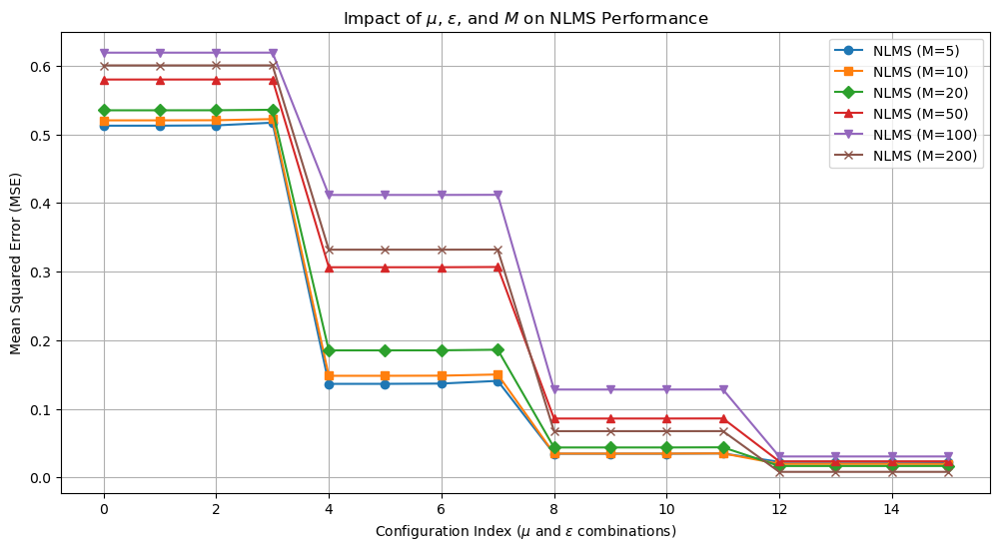

In [22]:
# generate the signal
t = np.linspace(0, 10, 3000)  # time vector
signal = (np.sin(2 * np.pi * t) +         # primary sinusoid
          0.5 * np.sin(2 * np.pi * 3 * t) +  # secondary sinusoid
          0.25 * np.sin(2 * np.pi * 5 * t))  # tertiary sinusoid

# parameters
noise_level = 0.3  # noise standard deviation
noise = np.random.normal(0, noise_level, len(t))  # gaussian noise
noisy_signal = signal + noise  # add noise to signal

# desired and input signals
d = signal  # desired signal
u = noisy_signal  # input signal (noisy)

# test parameters
M_values = [5, 10, 20, 50, 100, 200]  # filter sizes
mu_values = [0.0001, 0.001, 0.01, 0.1]  # step sizes
epsilon_values = [1e-4, 1e-3, 1e-2, 1e-1]  # normalization factors

# storage for results
results = {}

for M in M_values:  # iterate over filter sizes
    for mu in mu_values:  # iterate over step sizes
        for epsilon in epsilon_values:  # iterate over normalization factors
            totSamples = len(u)  # total samples
            w_NLMS = np.zeros((totSamples, M))  # initialize weights
            _, NLMS_Err, _ = NLMS(u, d, w_NLMS, M, totSamples, mu, epsilon)  # apply NLMS
            mse = np.mean(NLMS_Err[M:] ** 2)  # mean squared error after stabilization
            config = (M, mu, epsilon)  # store configuration
            results[config] = mse  # save results

# plot results
fig, ax = plt.subplots(figsize=(12, 6))
markers = ['o', 's', 'D', '^', 'v', 'x', '*', 'P', 'X']  # extended marker list
for idx, M in enumerate(M_values):  # iterate over filter sizes
    mse_values = [results[(M, mu, epsilon)] for mu in mu_values for epsilon in epsilon_values]  # mse for all configs
    label = f"NLMS (M={M})"  # label for filter size
    ax.plot(range(len(mse_values)), mse_values, label=label, marker=markers[idx % len(markers)])  # plot mse

# configure plot
ax.set_title(r"Impact of $\mu$, $\epsilon$, and $M$ on NLMS Performance")  # title
ax.set_xlabel(r"Configuration Index ($\mu$ and $\epsilon$ combinations)")  # x-axis label
ax.set_ylabel("Mean Squared Error (MSE)")  # y-axis label
ax.legend()  # legend
ax.grid()  # grid lines
plt.show()

### **Observations from the Output**

1. **Impact of Filter Size ($M$):**
   - As the filter size $M$ increases, the performance of NLMS varies significantly.
   - Smaller filter sizes ($M = 5, 10$) show relatively consistent error values across configurations.
   - Larger filter sizes ($M = 100, 200$) demonstrate more variability, indicating a stronger dependence on $\mu$ and $\epsilon$ for effective performance.

2. **Effect of Step Size ($\mu$):**
   - Larger step sizes ($\mu = 0.1$) can lead to higher errors for larger filter sizes, possibly due to overshooting during updates.
   - Smaller step sizes ($\mu = 0.0001$) tend to stabilize the error but may slow down convergence, resulting in suboptimal performance in some cases.

3. **Influence of Normalization Factor ($\epsilon$):**
   - Lower normalization factors ($\epsilon = 10^{-4}, 10^{-3}$) generally result in improved performance by ensuring smoother updates.
   - Higher values of $\epsilon$ lead to less effective normalization, resulting in higher steady-state errors.

4. **Plateau Behavior:**
   - For most filter sizes, there appears to be a point where further adjustments to $\mu$ and $\epsilon$ no longer significantly improve the error, suggesting a practical limit to optimization.

5. **Key Insight:**
   - Choosing appropriate $\mu$ and $\epsilon$ is critical for achieving optimal NLMS performance, particularly for larger filter sizes ($M \geq 50$). However, excessive tuning may lead to diminishing returns, as shown by the plateau behavior in the graph.

---

---

# Image Denoising Using LMS and NLMS

In this part, I aim to reproduce an image with added noise, following the same approach used in **Assignment 2**. The exact same **flattening** and **unflattening** methods, as well as the **LMS** algorithm, will be used to process the data. 

For denoising, I apply both **LMS** and **NLMS** algorithms in parallel and plot the results side by side to observe the differences. After visualizing the results, I will analyze and discuss the observed differences between the two methods.

In [27]:
def flatten_zigzag_diagonal(matrix):
    M, N = len(matrix), len(matrix[0])  # Get matrix dimensions
    result = []  # Initialize result list for 1D output

    for diag in range(M + N - 1):
        if diag % 2 == 0:
            # Traverse from bottom to top
            row = min(diag, M - 1)
            col = diag - row
            while row >= 0 and col < N:
                result.append(matrix[row][col])  # Append current element to result
                row -= 1
                col += 1
        else:
            # Traverse from top to bottom
            col = min(diag, N - 1)
            row = diag - col
            while col >= 0 and row < M:
                result.append(matrix[row][col])  # Append current element to result
                row += 1
                col -= 1

    return result  # Return the 1D zigzagged array

def unflatten_zigzag_diagonal(array, M, N):
    matrix = [[0] * N for _ in range(M)]  # Initialize MxN matrix
    index = 0  # Initialize index for array

    for diag in range(M + N - 1):
        if diag % 2 == 0:
            # Traverse from bottom to top
            row = min(diag, M - 1)
            col = diag - row
            while row >= 0 and col < N:
                matrix[row][col] = array[index]  # Place element in matrix
                index += 1
                row -= 1
                col += 1
        else:
            # Traverse from top to bottom
            col = min(diag, N - 1)
            row = diag - col
            while col >= 0 and row < M:
                matrix[row][col] = array[index]  # Place element in matrix
                index += 1
                row += 1
                col -= 1

    return matrix  # Return the reconstructed matrix

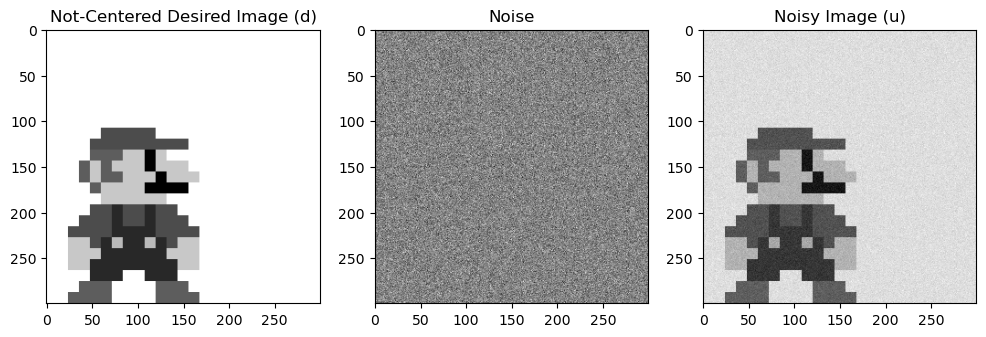

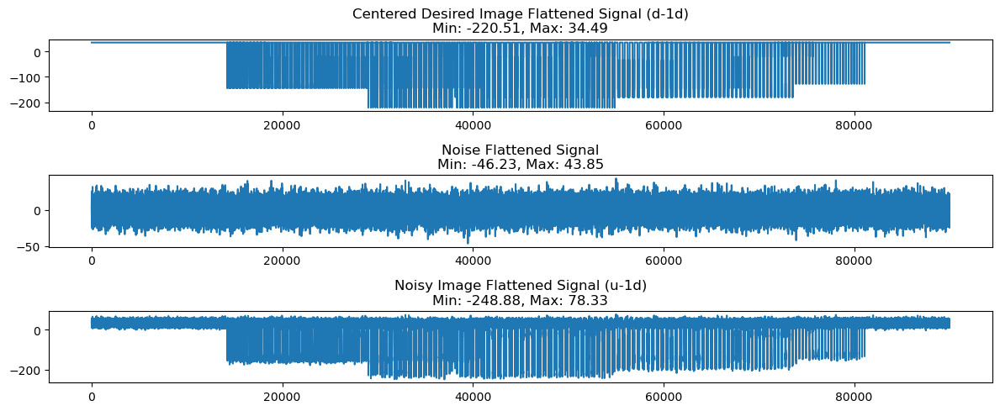

In [28]:
# Load and preprocess the image
image = cv.imread('Data/mario.png', cv.IMREAD_GRAYSCALE)  # load image in grayscale
image = cv.resize(image, (300, 300))  # resize to 300x300

# Generate centered image and add noise
d = image - np.mean(image)  # create centered desired image
noise_level = 10  # define noise level
noise = np.random.normal(0, noise_level, size=image.shape)  # generate Gaussian noise
u = d + noise  # add noise to the centered image to create the noisy image

# Visualize images
fig = plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(d + np.mean(image), cmap='gray')  # add mean back for visualization
plt.title('Not-Centered Desired Image (d)')

plt.subplot(1, 3, 2)
plt.imshow(noise, cmap='gray')  # plot noise
plt.title('Noise')

plt.subplot(1, 3, 3)
plt.imshow(u + np.mean(image), cmap='gray')  # add mean back for visualization
plt.title('Noisy Image (u)')

# Visualize 1D flattened signals with min/max in titles
fig = plt.figure(figsize=(12, 5))

plt.subplot(3, 1, 1)
plt.plot(flatten_zigzag_diagonal(d))  # flattened centered desired image
plt.title(f'Centered Desired Image Flattened Signal (d-1d)\nMin: {d.min():.2f}, Max: {d.max():.2f}')

plt.subplot(3, 1, 2)
plt.plot(flatten_zigzag_diagonal(noise))  # flattened noise signal
plt.title(f'Noise Flattened Signal\nMin: {noise.min():.2f}, Max: {noise.max():.2f}')

plt.subplot(3, 1, 3)
plt.plot(flatten_zigzag_diagonal(u))  # flattened noisy image
plt.title(f'Noisy Image Flattened Signal (u-1d)\nMin: {u.min():.2f}, Max: {u.max():.2f}')

plt.tight_layout()  # adjust layout for better visualization

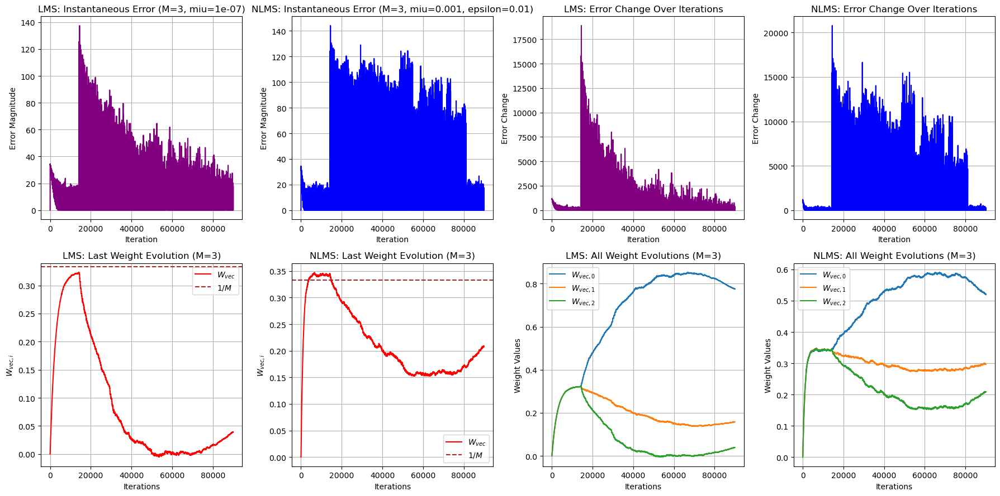

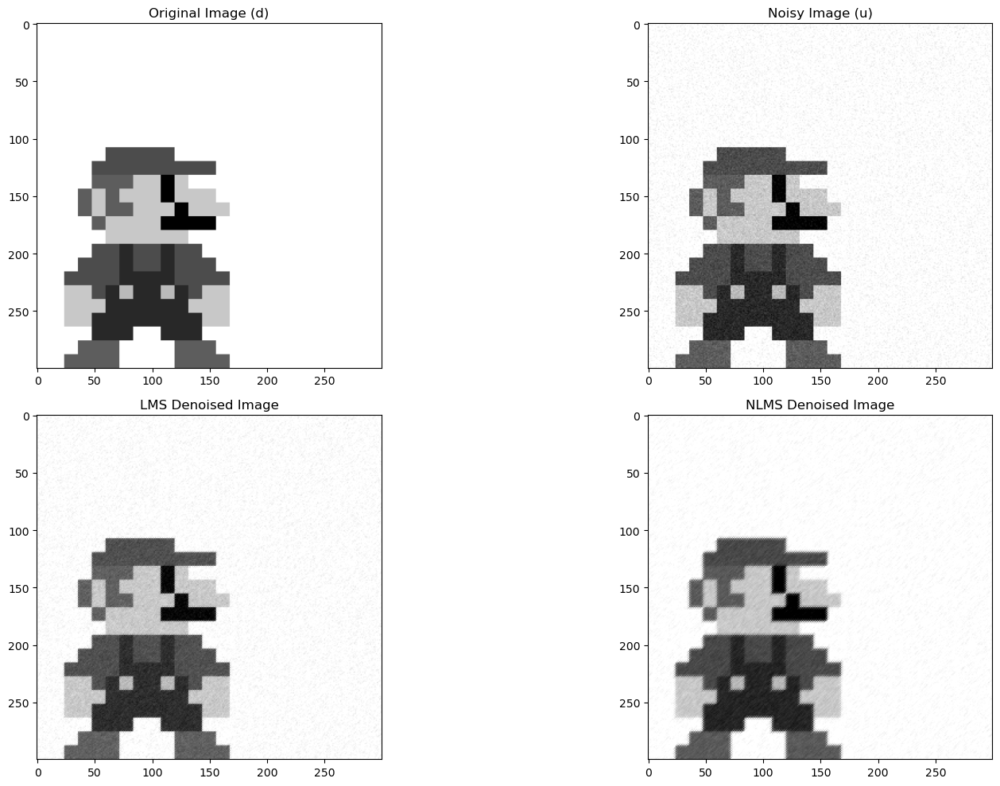

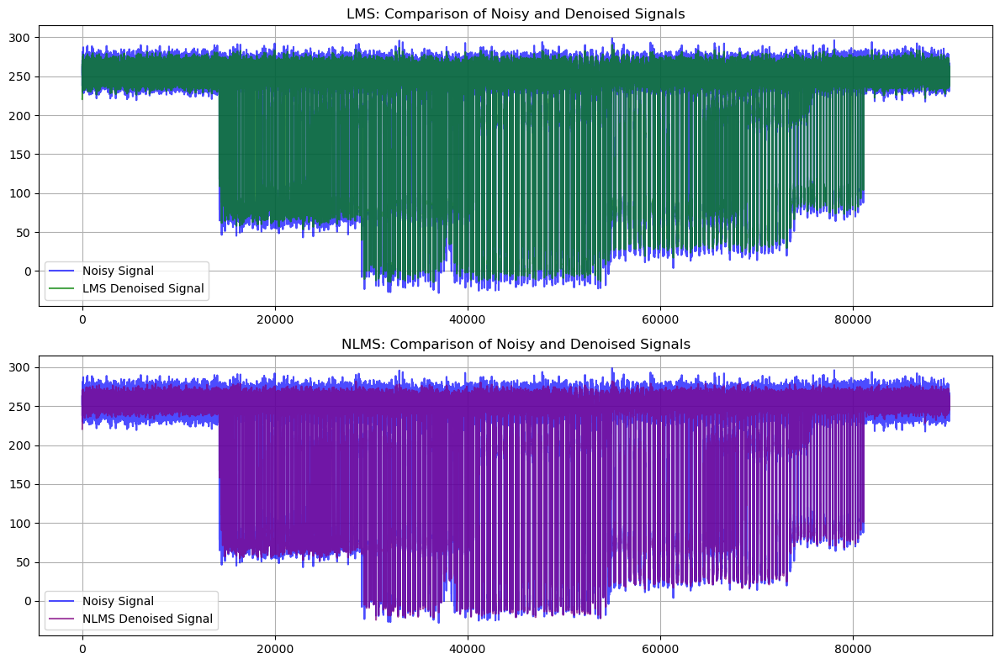

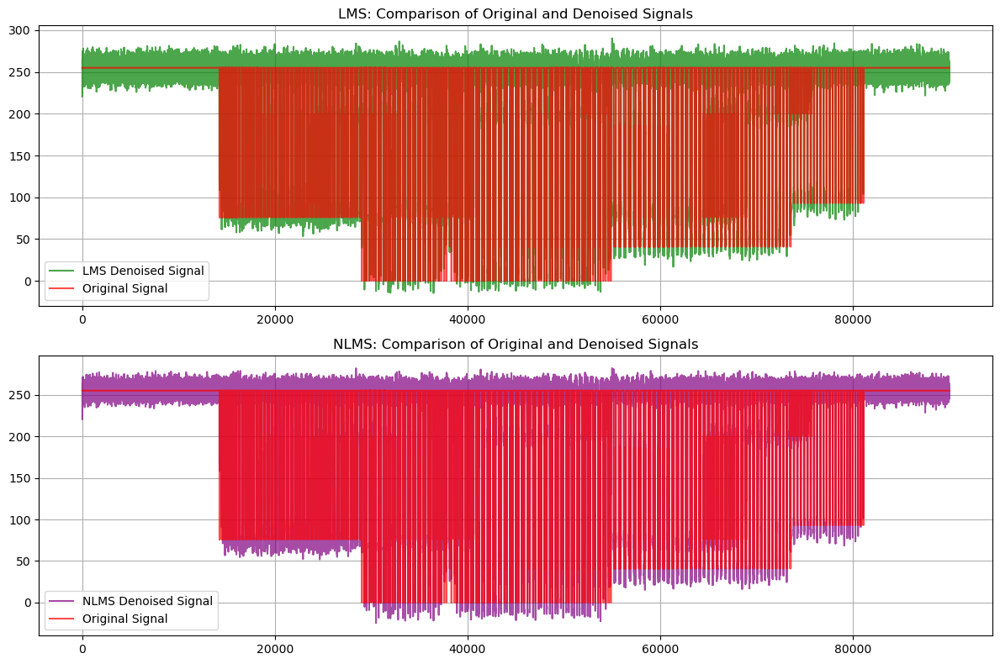

In [29]:
# Set parameters for LMS and NLMS
M = 3  # Number of filter coefficients
miu_lms = 1e-7  # Step size for LMS
miu_nlms = 0.001  # Step size for NLMS
epsilon = 1e-2  # Normalization factor for NLMS

# Flatten the noisy and desired signals
u_1d = flatten_zigzag_diagonal(u)  # Noisy signal
d_1d = flatten_zigzag_diagonal(d)  # Desired signal
totSamples = len(u_1d)  # Total samples

# Initialize weights for LMS and NLMS
w_lms = np.zeros((totSamples, M))  # LMS weights
w_nlms = np.zeros((totSamples, M))  # NLMS weights

# Apply LMS algorithm
newW_lms, LMSErr, error_changes_lms = LMS(u_1d, d_1d, w_lms, M, totSamples, miu_lms)

# Apply NLMS algorithm
newW_nlms, NLMS_Err, error_changes_nlms = NLMS(u_1d, d_1d, w_nlms, M, totSamples, miu_nlms, epsilon)

# Plot instantaneous error comparison
plt.figure(figsize=(18, 9))

# LMS: Instantaneous Error Magnitude
plt.subplot(2, 4, 1)
plt.plot(abs(LMSErr), color='purple')
plt.title(f"LMS: Instantaneous Error (M={M}, miu={miu_lms})")
plt.xlabel("Iteration")
plt.ylabel("Error Magnitude")
plt.grid(True)

# NLMS: Instantaneous Error Magnitude
plt.subplot(2, 4, 2)
plt.plot(abs(NLMS_Err), color='blue')
plt.title(f"NLMS: Instantaneous Error (M={M}, miu={miu_nlms}, epsilon={epsilon})")
plt.xlabel("Iteration")
plt.ylabel("Error Magnitude")
plt.grid(True)

# LMS: Error Change Over Iterations
plt.subplot(2, 4, 3)
plt.plot(error_changes_lms, color='purple')
plt.title("LMS: Error Change Over Iterations")
plt.xlabel("Iteration")
plt.ylabel("Error Change")
plt.grid(True)

# NLMS: Error Change Over Iterations
plt.subplot(2, 4, 4)
plt.plot(error_changes_nlms, color='blue')
plt.title("NLMS: Error Change Over Iterations")
plt.xlabel("Iteration")
plt.ylabel("Error Change")
plt.grid(True)

# LMS: Last Weight Evolution
plt.subplot(2, 4, 5)
plt.plot(newW_lms[:, M - 1], color='red', label=r'$W_{vec}$')
plt.axhline(y=1/M, color='brown', linestyle='--', label=r'$1/M$')
plt.title(f"LMS: Last Weight Evolution (M={M})")
plt.xlabel("Iterations")
plt.ylabel(r"$W_{vec,i}$")
plt.legend()
plt.grid(True)

# NLMS: Last Weight Evolution
plt.subplot(2, 4, 6)
plt.plot(newW_nlms[:, M - 1], color='red', label=r'$W_{vec}$')
plt.axhline(y=1/M, color='brown', linestyle='--', label=r'$1/M$')
plt.title(f"NLMS: Last Weight Evolution (M={M})")
plt.xlabel("Iterations")
plt.ylabel(r"$W_{vec,i}$")
plt.legend()
plt.grid(True)

# LMS: All Weight Evolutions
plt.subplot(2, 4, 7)
for i in range(M):
    plt.plot(newW_lms[:, i], label=fr'$W_{{vec,{i}}}$')
plt.title(f"LMS: All Weight Evolutions (M={M})")
plt.xlabel("Iterations")
plt.ylabel("Weight Values")
plt.legend()
plt.grid(True)

# NLMS: All Weight Evolutions
plt.subplot(2, 4, 8)
for i in range(M):
    plt.plot(newW_nlms[:, i], label=fr'$W_{{vec,{i}}}$')
plt.title(f"NLMS: All Weight Evolutions (M={M})")
plt.xlabel("Iterations")
plt.ylabel("Weight Values")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Filter the noisy signal for LMS
filtered_image_lms = np.zeros_like(u_1d)
for i in range(M - 1, totSamples):
    filtered_image_lms[i] = np.dot(newW_lms[-1, :], u_1d[i - M + 1: i + 1][::-1])

# Filter the noisy signal for NLMS
filtered_image_nlms = np.zeros_like(u_1d)
for i in range(M - 1, totSamples):
    filtered_image_nlms[i] = np.dot(newW_nlms[-1, :], u_1d[i - M + 1: i + 1][::-1])

# Reshape filtered signals back to images
filtered_image_lms += np.mean(image)
filtered_image_nlms += np.mean(image)
image_denoised_lms = unflatten_zigzag_diagonal(np.clip(filtered_image_lms, 0, 255), image.shape[0], image.shape[1])
image_denoised_nlms = unflatten_zigzag_diagonal(np.clip(filtered_image_nlms, 0, 255), image.shape[0], image.shape[1])

# Display images
plt.figure(figsize=(18, 10))

# Original and Noisy Images
plt.subplot(2, 2, 1)
plt.imshow(d, cmap='gray')
plt.title("Original Image (d)")

plt.subplot(2, 2, 2)
plt.imshow(np.clip(u + np.mean(image), 0, 255), cmap='gray')
plt.title("Noisy Image (u)")

# LMS Denoised Image
plt.subplot(2, 2, 3)
plt.imshow(image_denoised_lms, cmap='gray')
plt.title("LMS Denoised Image")

# NLMS Denoised Image
plt.subplot(2, 2, 4)
plt.imshow(image_denoised_nlms, cmap='gray')
plt.title("NLMS Denoised Image")

plt.tight_layout()
plt.show()

# Signal comparisons for LMS and NLMS
plt.figure(figsize=(12, 8))

# LMS: Comparison of Noisy and Denoised Signals
plt.subplot(2, 1, 1)
plt.plot(u_1d + np.mean(image), label="Noisy Signal", color='blue', alpha=0.7)
plt.plot(filtered_image_lms, label="LMS Denoised Signal", color='green', alpha=0.7)
plt.title("LMS: Comparison of Noisy and Denoised Signals")
plt.legend()
plt.grid(True)

# NLMS: Comparison of Noisy and Denoised Signals
plt.subplot(2, 1, 2)
plt.plot(u_1d + np.mean(image), label="Noisy Signal", color='blue', alpha=0.7)
plt.plot(filtered_image_nlms, label="NLMS Denoised Signal", color='purple', alpha=0.7)
plt.title("NLMS: Comparison of Noisy and Denoised Signals")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Original vs Denoised Signals
plt.figure(figsize=(12, 8))

# LMS: Comparison of Original and Denoised Signals
plt.subplot(2, 1, 1)
plt.plot(filtered_image_lms, label="LMS Denoised Signal", color='green', alpha=0.7)
plt.plot(d_1d + np.mean(image), label="Original Signal", color='red', alpha=0.7)
plt.title("LMS: Comparison of Original and Denoised Signals")
plt.legend()
plt.grid(True)

# NLMS: Comparison of Original and Denoised Signals
plt.subplot(2, 1, 2)
plt.plot(filtered_image_nlms, label="NLMS Denoised Signal", color='purple', alpha=0.7)
plt.plot(d_1d + np.mean(image), label="Original Signal", color='red', alpha=0.7)
plt.title("NLMS: Comparison of Original and Denoised Signals")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### Analysis of LMS vs. NLMS for Image Denoising

#### **Introduction**
In this experiment, we used LMS and NLMS algorithms to denoise an image and compare their performance. The parameters were set as follows:
- LMS: $M=3$, $\mu = 1 \times 10^{-7}$.
- NLMS: $M=3$, $\mu = 0.001$, $\epsilon = 0.01$.

We analyzed their behavior using multiple plots for instantaneous error, error change, weight evolution, and visual comparisons between the original, noisy, and denoised images.

---

#### **Instantaneous Error**
- **LMS**: The instantaneous error decreases consistently over iterations. This gradual reduction reflects the slower convergence of LMS as it updates weights uniformly, without considering the input signal's magnitude.
- **NLMS**: The instantaneous error fluctuates significantly in the beginning but stabilizes faster. This behavior is due to the normalization factor in NLMS, which dynamically adjusts learning rates based on the input signal’s energy. The result is quicker error reduction in the early iterations.

---

#### **Error Change Over Iterations**
- **LMS**: The error change reduces smoothly and monotonically, showing that LMS converges steadily but slowly over time.
- **NLMS**: The error change fluctuates more in the initial stages, which is characteristic of its faster learning process. Eventually, it stabilizes as the weights converge.

---

#### **Weight Evolution**
- **LMS**: The weights evolve gradually and smoothly across iterations. They converge more slowly compared to NLMS, reflecting LMS’s consistent but slower adaptation.
- **NLMS**: The weights converge faster due to the normalization factor. However, there are slight fluctuations in the weights even toward the later iterations, which is a side effect of NLMS’s dynamic nature.

Both algorithms use the **final weights** for denoising, so the speed of convergence does not affect the final denoised image.

---

#### **Visual Comparison of Denoised Images**
1. **LMS Denoised Image**:
   - The LMS-denoised image retains more fine details but has some visible residual noise.
   - This result is consistent with LMS's slower and steadier learning process, which does not suppress noise as strongly as NLMS.

2. **NLMS Denoised Image**:
   - The NLMS-denoised image appears smoother and suppresses noise more effectively. However, some fine details are slightly blurred or lost, likely due to NLMS’s aggressive noise suppression.

The denoised images are generated using the final weights, meaning the convergence speed differences observed earlier do not influence the results directly.

---

#### **Signal Comparison**
1. **Noisy vs. Denoised Signals**:
   - LMS reduces the noise but retains slight fluctuations in the signal, indicating some residual noise.
   - NLMS smooths the signal more effectively, resulting in a cleaner output with less noise.

2. **Original vs. Denoised Signals**:
   - LMS denoised signals align closely with the original, preserving more detail but also retaining some noise.
   - NLMS denoised signals deviate slightly in regions with high noise, but the overall smoothing effect makes it cleaner.

---

#### **Conclusion**
This experiment highlights the strengths and weaknesses of LMS and NLMS for image denoising:
- **LMS**:
  - Slower convergence but more stable weight evolution.
  - Retains more details in the denoised image but leaves behind some residual noise.
- **NLMS**:
  - Faster convergence due to the normalization factor.
  - Suppresses noise more effectively but may lose fine details in the process.

The choice between LMS and NLMS depends on the application:
- Use **LMS** if detail preservation is more critical.
- Use **NLMS** if stronger noise suppression and faster adaptation are required.

The visual and numerical results clearly demonstrate that NLMS is better at suppressing noise, while LMS strikes a balance between detail retention and noise reduction.

---

### Experiment: LMS and NLMS on a Diagonal Gradient Image

In this part, we apply the LMS and NLMS algorithms to denoise a diagonal gradient image with pixel values increasing linearly in a zigzag pattern. Noise is added to simulate real-world conditions, and the performance of both algorithms is evaluated.

#### Steps of the Experiment:
1. **Gradient Image Creation**:
   - A 300x300 diagonal gradient image is generated with pixel values ranging from 0 to 255 in a zigzag pattern.
   - Noise with a standard deviation of 20 is added.

2. **Denoising with LMS**:
   - Parameters: $M=30$, $\mu=1 \times 10^{-9}$.

3. **Denoising with NLMS**:
   - Parameters: $M=30$, $\mu=1 \times 10^{-2}$, $\epsilon=1 \times 10^{-1}$.

4. **Comparison**:
   - The original, noisy, and denoised images are visually and numerically compared.
   - Metrics such as error reduction and weight evolution are analyzed.


In [33]:
def lms_nlms_over_file(file_path, noise_level, M, miu, W=0, use_another_w=False, output_print=False, NLMS_function=False, epsilon = 1e-6):
    
    image = cv.imread(file_path, cv.IMREAD_GRAYSCALE)  # load grayscale image
    image = cv.resize(image, (300, 300))  # resize to 300x300
    d = image - np.mean(image)  # create zero-mean desired image
    noise = np.random.normal(0, noise_level, size=image.shape)  # generate Gaussian noise
    u = d + noise  # create noisy image
    u_1d = flatten_zigzag_diagonal(u)  # flatten noisy image
    d_1d = flatten_zigzag_diagonal(d)  # flatten desired image
    totSamples = len(u_1d)  # total number of samples
    w = np.zeros((totSamples, M))  # initialize weights
    if NLMS_function==True:
        newW, LMSErr, error_changes = NLMS(u_1d, d_1d, w, M, totSamples, miu, epsilon) # apply LMS algorithm
    else:
        newW, LMSErr, error_changes = LMS(u_1d, d_1d, w, M, totSamples, miu)  # apply LMS algorithm
    
    if not use_another_w:
        W = newW[-1,:]
        
    # filter the noisy signal
    filtered_image_flattened = np.zeros_like(u_1d)
    for i in range(M - 1, totSamples):
        filtered_image_flattened[i] = np.dot(W, u_1d[i - M + 1: i + 1][::-1])
    filtered_image_flattened += np.mean(image)  # restore mean
    filtered_image_flattened_cliped = np.clip(filtered_image_flattened, 0, 255)  # clip values
    image_denoised = unflatten_zigzag_diagonal(filtered_image_flattened_cliped, image.shape[0], image.shape[1])

    if output_print:  # if output visualization is required

        plt.figure(figsize=(14, 6))  # create a grid for error and weight plots

        if not use_another_w:
            # plot instantaneous LMS error
            plt.subplot(2, 2, 1)
            plt.plot(abs(LMSErr), color='purple')
            plt.title(f"Instantaneous LMS Error Per Iteration (M={M}, miu={miu})")
            plt.xlabel("Iteration")
            plt.ylabel("Instantaneous Error Magnitude")
            plt.grid(True)
            
            # plot total error changes
            plt.subplot(2, 2, 2)
            plt.plot(error_changes, color='blue')
            plt.title("Error Change Over Iterations")
            plt.xlabel("Iteration")
            plt.ylabel("Change in Total Error")
            plt.grid(True)
        
        # plot weight evolution for the last weight
        plt.subplot(2, 2, 3)
        plt.plot(newW[:, M - 1], color='red', label=r'$W_{vec}$')
        plt.axhline(y=1/M, color='brown', linestyle='--', label=r'$1/M$')
        plt.title(f"Last Weight Evolution (M={M}, miu={miu})")
        plt.xlabel("Iterations (i)")
        plt.ylabel(r"$W_{vec,i}$")
        plt.grid(True)
        plt.legend()
        
        # plot all weight evolutions
        plt.subplot(2, 2, 4)
        for i in range(M):
            plt.plot(newW[:, i])
        plt.title(f"All Weight Evolutions (M={M}, miu={miu})")
        plt.xlabel("Iterations (i)")
        plt.ylabel("Weight Values")
        plt.grid(True)
        
        plt.tight_layout()

        # display original, noisy, and denoised images
        plt.figure(figsize=(18, 6))
        
        plt.subplot(1, 3, 1)
        plt.imshow(d, cmap='gray')
        plt.title("Original Image (d)")
        
        plt.subplot(1, 3, 2)
        plt.imshow(np.clip(u + np.mean(image), 0, 255), cmap='gray')  # add mean to restore original intensity range and clip values for comparison
        plt.title("Noisy Image (Mean Added and Clipped) (u)")
        
        plt.subplot(1, 3, 3)
        plt.imshow(image_denoised, cmap='gray')
        plt.title("Denoised Image")
        
        plt.tight_layout()
        
        # compare noisy and denoised signals
        plt.figure(figsize=(12, 4))
        plt.plot(u_1d + np.mean(image), label="Noisy Signal (u-1d)", alpha=0.7, color='blue')
        plt.plot(filtered_image_flattened_cliped, label="Denoised Signal (Clipped)", alpha=0.7, color='green')
        plt.title("Comparison of Noisy and Denoised Signals")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        
        # compare original and denoised signals
        plt.figure(figsize=(12, 4))
        plt.plot(filtered_image_flattened_cliped, label="Denoised Signal (Clipped)", alpha=0.7, color='green')
        plt.plot(d_1d + np.mean(image), label="Original Signal (d-1d)", alpha=0.7, color='red')
        plt.title("Comparison of Original and Denoised Signals")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()

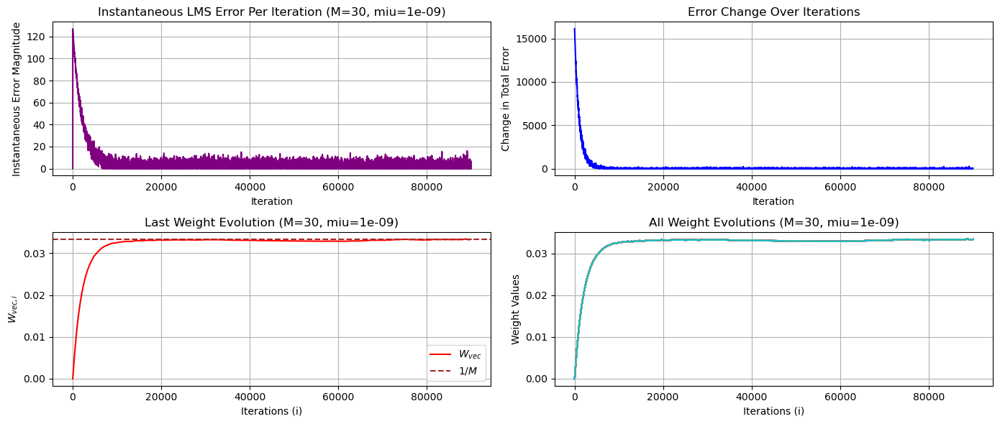

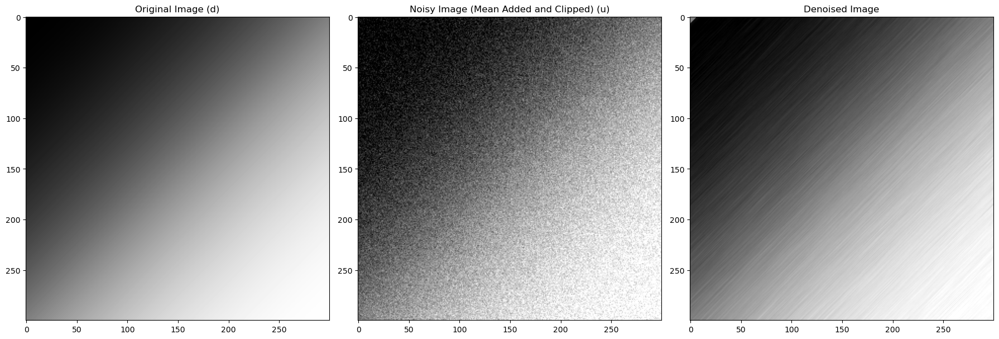

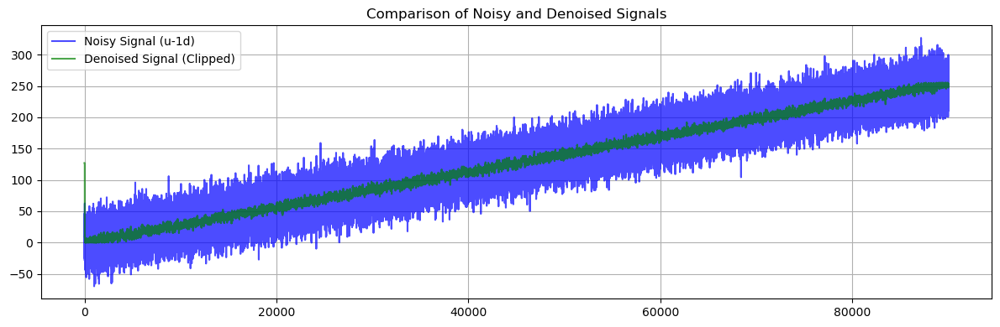

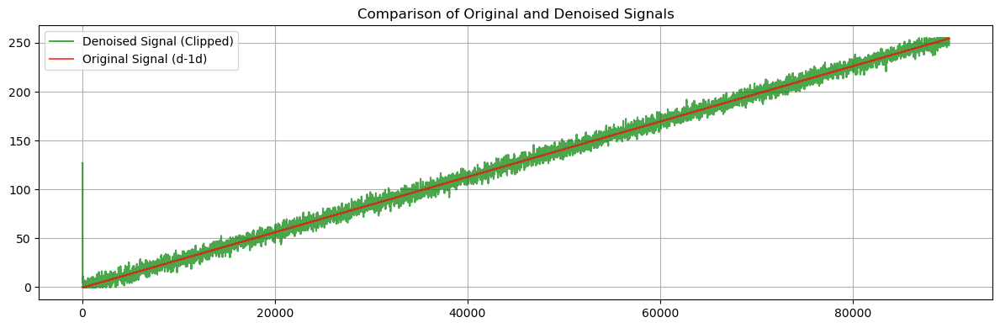

In [34]:
# Create a diagonal gradient image, where pixel values increase linearly along the zigzag diagonal pattern
image = np.array(unflatten_zigzag_diagonal(np.linspace(0, 255, 90000, dtype=np.uint8), 300, 300))
cv.imwrite("Data/diagonal_gradient_image.png", image)
lms_nlms_over_file(file_path='Data/diagonal_gradient_image.png', noise_level=20, M=30, miu=1e-9, output_print=True, NLMS_function=False)

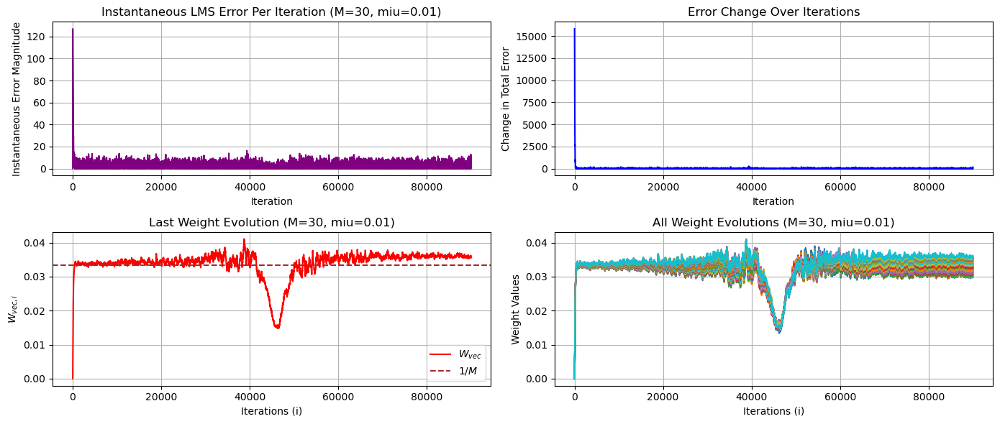

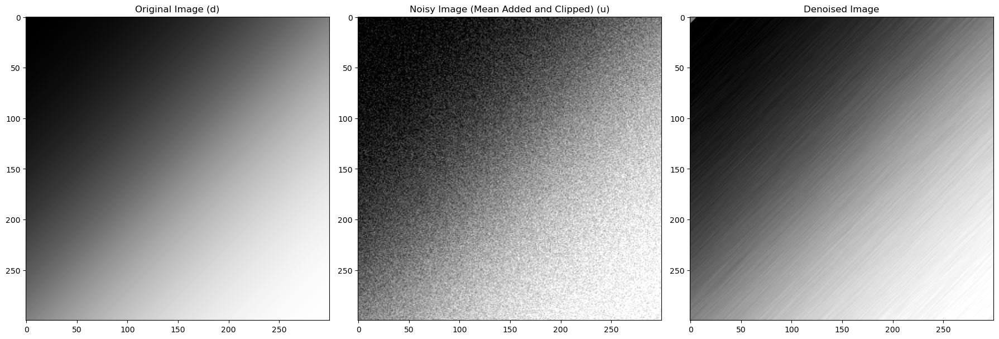

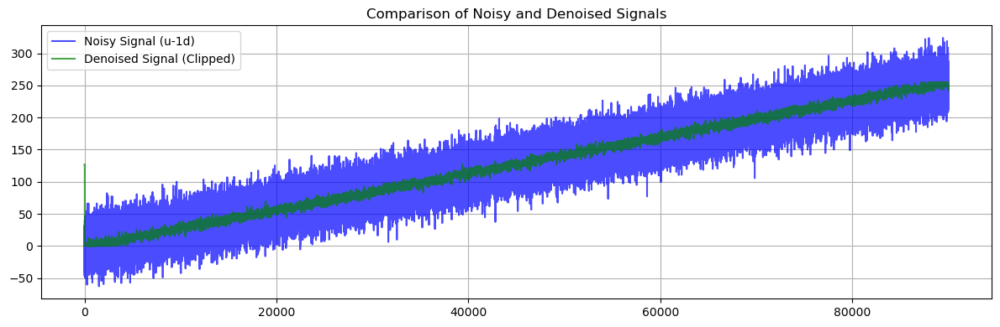

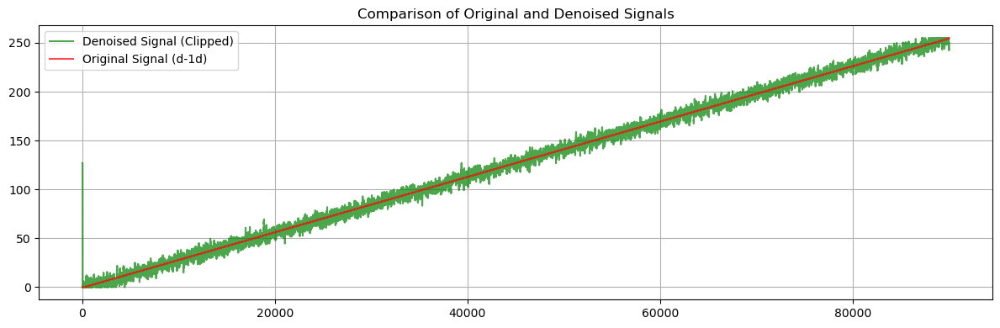

In [35]:
# Create a diagonal gradient image, where pixel values increase linearly along the zigzag diagonal pattern
image = np.array(unflatten_zigzag_diagonal(np.linspace(0, 255, 90000, dtype=np.uint8), 300, 300))
cv.imwrite("Data/diagonal_gradient_image.png", image)
lms_nlms_over_file(file_path='Data/diagonal_gradient_image.png', noise_level=20, M=30, miu=1e-2, output_print=True, NLMS_function=True, epsilon = 1e-1)

## Analysis of LMS and NLMS for Diagonal Gradient Image

#### **Instantaneous Error**
- **LMS**: The instantaneous error decreases steadily and converges quickly, demonstrating smooth error reduction. The consistent decrease indicates stable convergence.
- **NLMS**: The error reduction is faster initially compared to LMS due to the normalization factor. However, slight fluctuations are observed as NLMS dynamically adjusts weights based on input energy.

#### **Error Change**
- **LMS**: The error change reduces consistently and stabilizes, with no significant spikes. This reflects uniform updates across iterations.
- **NLMS**: Initially, the error change is higher but decreases faster compared to LMS. Small spikes are observed due to the normalization factor adjusting to varying input energy.

#### **Last Weight Evolution**
- **LMS**: The last weight evolves uniformly and converges to the expected value of $1/M$ (where $M = 30$). The curve is smooth and stable, indicating consistent updates for all coefficients.
- **NLMS**: The last weight also converges near $1/M$, but minor fluctuations are observed due to normalization. These fluctuations occur because NLMS adapts weights dynamically based on the input energy.

#### **All Weight Evolutions**
- **LMS**: All weights converge uniformly to the same value ($1/M$). This uniformity results from LMS applying the same update rule to all coefficients, regardless of input variations.
- **NLMS**: Weights exhibit slight variations, visible as non-overlapping curves. This difference arises because NLMS normalizes updates, making each weight evolve independently based on the input signal’s energy.

#### **Comparison of LMS and NLMS**
1. **Convergence Speed**:
   - NLMS converges faster in the initial iterations due to its dynamic normalization factor.
   - LMS has a slower but steady convergence rate.

2. **Weight Behavior**:
   - LMS updates weights uniformly, leading to identical final values.
   - NLMS adjusts weights dynamically, creating minor differences between coefficients, enhancing adaptability.

3. **Error Behavior**:
   - Both algorithms effectively reduce error, but NLMS achieves faster initial error reduction.

#### **Conclusion**
- Both LMS and NLMS perform well in denoising the diagonal gradient image, producing visually similar results.
- NLMS is faster and more adaptive due to its normalization mechanism, but it introduces slight fluctuations in weights and errors.
- LMS is simpler and stable, making it reliable for uniform weight updates. The choice between LMS and NLMS depends on the specific application and the need for speed versus stability.

---
---

### Optional extra 1
# Problem 10: Estimating AR(2) Parameters Using NLMS

In **Problem 10**, the NLMS algorithm is used to estimate the parameters $a_1$ and $a_2$ of a second-order AR(2) process. The task is divided into three parts:

1. **Part (a):** Plot the learning curve of NLMS for given parameters ($\mu = 0.2$, $\epsilon = 0.5$) averaged over 100 Monte Carlo runs and estimate $a_1$ and $a_2$.
2. **Part (b):** Analyze the tap-weight errors and visualize their convergence to the theoretical values.
3. **Part (c):** Repeat parts (a) and (b) for $\epsilon = 0.25$ and $\epsilon = 0.75$ and compare the results.

In [39]:
def generate_ar2(a1, a2, sigma_v2, num_samples):
    u = np.zeros(num_samples)  
    v = np.random.normal(0, np.sqrt(sigma_v2), num_samples)  # generate noise
    for n in range(2, num_samples):  
        u[n] = -a1 * u[n - 1] - a2 * u[n - 2] + v[n]  # AR(2) equation
    return u  

In [40]:
def nlms_ar2(u, d, miu, epsilon, num_samples):
    w = np.zeros((num_samples, 2))  # initialize weights
    e = np.zeros(num_samples)  # prediction error
    for n in range(2, num_samples):  
        x = np.array([u[n - 1], u[n - 2]])  
        norm_factor = np.dot(x, x) + epsilon  
        e[n] = d[n] - np.dot(w[n - 1], x)  # compute error
        w[n] = w[n - 1] + (miu / norm_factor) * e[n] * x  # update weights
    return w, e  

In [41]:
def MC_simulation(a1, a2, sigma_v2, miu, epsilon, num_samples, num_runs):
    mse_per_run = np.zeros((num_runs, num_samples))  # mse for each run
    weight_evolution = np.zeros((num_samples, 2))  # avg weights over runs

    for run in range(num_runs):  # run monte carlo
        u = generate_ar2(a1, a2, sigma_v2, num_samples)  # generate AR(2) data
        w, e = nlms_ar2(u, u, miu, epsilon, num_samples)  # apply nlms
        mse_per_run[run] = e**2  # save squared error
        weight_evolution += w  # sum weights

    learning_curve = np.mean(mse_per_run, axis=0)  # avg mse over runs
    avg_weights = weight_evolution / num_runs  # avg weights
    return learning_curve, avg_weights 

### Part (a): Estimating AR(2) Parameters

In this part, we estimate the AR(2) parameters $a_1$ and $a_2$ using the NLMS algorithm with $\mu = 0.2$ and $\epsilon = 0.5$. The squared error $e(n)$ is averaged over 100 Monte Carlo runs.

The results are as follows:
- Theoretical $a_1 = 0.1$, Estimated $a_1 = 0.1262$
- Theoretical $a_2 = -0.8$, Estimated $a_2 = -0.7213$

The plots show:
1. The **learning curve**, which highlights the average Mean Squared Error (MSE) over iterations, demonstrating the convergence of the NLMS algorithm.
2. The **parameter estimation**, where the tap weights converge to the true values of $a_1$ and $a_2$.
3. The **prediction error**, showing the evolution of $e(n)$ over time.

These results confirm that the NLMS algorithm accurately estimates the AR(2) parameters and demonstrates stable convergence.

Chosen μ: 0.2
Theoretical a1: 0.1, Estimated a1: 0.0897
Theoretical a2: -0.8, Estimated a2: -0.7059


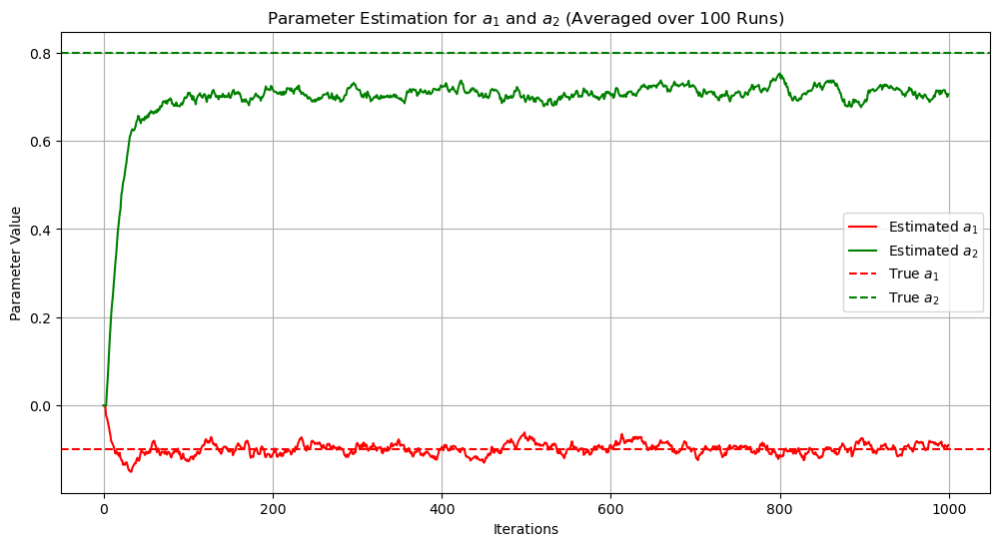

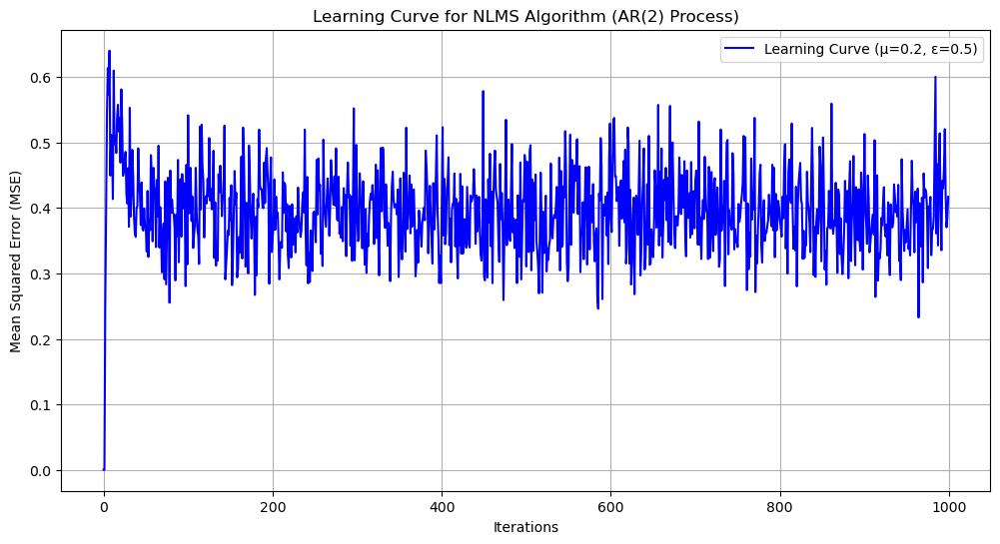

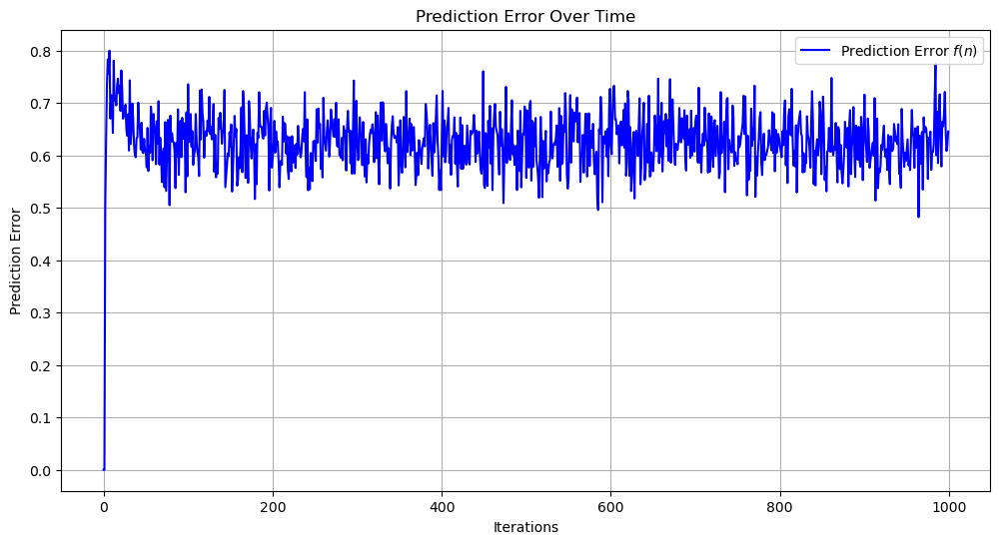

In [43]:
# Define AR(2) parameters
a1 = 0.1  # AR coefficient 1
a2 = -0.8  # AR coefficient 2
num_samples = 1000  # number of samples
sigma_v2 = 1 - (a1**2 + a2**2)  # noise variance for AR process
miu = 0.2  # step size
epsilon = 0.5  # normalization factor
num_runs = 100  # number of Monte Carlo runs

print(f"Chosen μ: {miu}")

# Compute learning curve and average weights over 100 Monte Carlo runs
f, w = MC_simulation(a1, a2, sigma_v2, miu, epsilon, num_samples, num_runs)

estimated_a1 = -w[-1, 0]  # estimated a1
estimated_a2 = -w[-1, 1]  # estimated a2

# Display theoretical and estimated parameters
print(f"Theoretical a1: {a1}, Estimated a1: {estimated_a1:.4f}")
print(f"Theoretical a2: {a2}, Estimated a2: {estimated_a2:.4f}")

# Plot estimated parameters versus true values
plt.figure(figsize=(12, 6))
plt.plot(w[:, 0], label="Estimated $a_1$", color="red")  # plot estimated a1
plt.plot(w[:, 1], label="Estimated $a_2$", color="green")  # plot estimated a2
plt.axhline(y=-a1, color="red", linestyle="--", label="True $a_1$")  # true a1
plt.axhline(y=-a2, color="green", linestyle="--", label="True $a_2$")  # true a2
plt.title("Parameter Estimation for $a_1$ and $a_2$ (Averaged over 100 Runs)")
plt.xlabel("Iterations")
plt.ylabel("Parameter Value")
plt.grid(True)
plt.legend()
plt.show()

# Plot the learning curve
plt.figure(figsize=(12, 6))
plt.plot(f, label=f"Learning Curve (μ={miu}, ε={epsilon})", color="blue")  # plot learning curve
plt.title("Learning Curve for NLMS Algorithm (AR(2) Process)")
plt.xlabel("Iterations")
plt.ylabel("Mean Squared Error (MSE)")
plt.grid(True)
plt.legend()
plt.show()

# Plot root mean squared error
mse = np.sqrt(f)  # RMSE
plt.figure(figsize=(12, 6))
plt.plot(mse, label="Prediction Error $f(n)$", color="blue")  # plot prediction error
plt.title("Prediction Error Over Time")
plt.xlabel("Iterations")
plt.ylabel("Prediction Error")
plt.grid(True)
plt.legend()
plt.show()

### **Part (b): Tap-Weight Error Analysis**

In this part, we compute and analyze the tap-weight errors $e_1(n)$ and $e_2(n)$ for the NLMS algorithm.

- **Prediction Error:** The algorithm minimizes the error $f(n)$ over time, resulting in a low steady-state error.
- **Tap-Weight Errors:** The errors in estimating $a_1$ and $a_2$, represented by $e_1(n)$ and $e_2(n)$, converge to near-zero values as the algorithm progresses.

#### Results:
- **Final Prediction Error (MSE):** The mean squared prediction error is small, reflecting accurate predictions.
- **Tap-Weight Errors:** The errors $e_1(n)$ and $e_2(n)$ converge steadily, showing that the algorithm effectively estimates the true coefficients $a_1$ and $a_2$.

This analysis confirms the accuracy and convergence behavior of NLMS for estimating the AR(2) process coefficients.

Final prediction error (f[n]): 0.3436
Final tap-weight error for a1 (e1[n]): -0.0103
Final tap-weight error for a2 (e2[n]): 0.0941


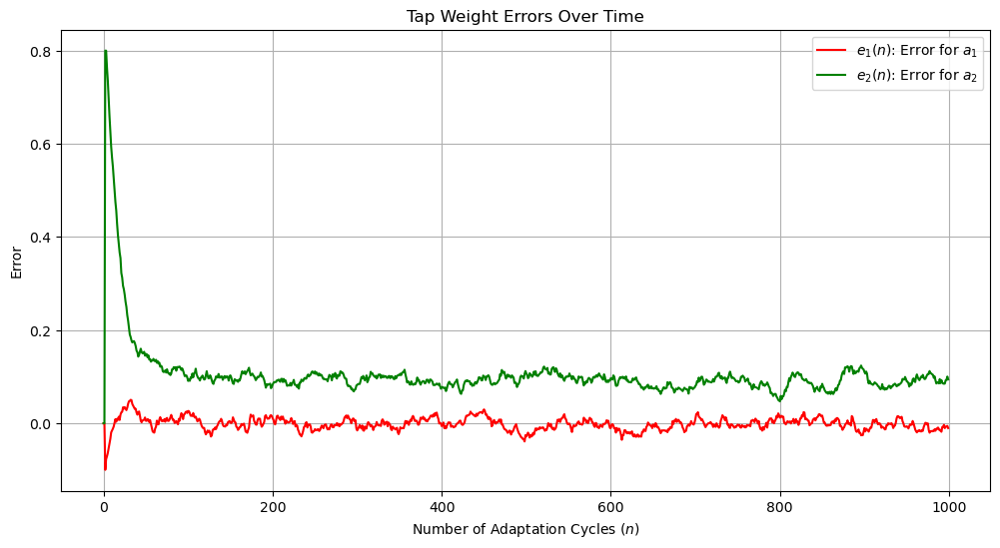

In [45]:
# Function to compute errors for averaged weights
def compute_errors(u, avg_weights, a1, a2, num_samples):
    f = np.zeros(num_samples)  # prediction error
    e1 = np.zeros(num_samples)  # tap-weight error for a1
    e2 = np.zeros(num_samples)  # tap-weight error for a2

    for n in range(2, num_samples):
        x = np.array([u[n - 1], u[n - 2]])  # input vector
        f[n] = u[n] - np.dot(avg_weights[n - 1], x)  # compute prediction error
        e1[n] = -a1 - avg_weights[n, 0]  # compute tap-weight error for a1
        e2[n] = -a2 - avg_weights[n, 1]  # compute tap-weight error for a2
    return f, e1, e2

u = generate_ar2(a1, a2, sigma_v2, num_samples)  # generate AR(2) process

f, e1, e2 = compute_errors(u, w, a1, a2, num_samples)  # compute errors

print(f"Final prediction error (f[n]): {np.mean(f**2):.4f}")  # mean squared error of f
print(f"Final tap-weight error for a1 (e1[n]): {e1[-1]:.4f}")  # final error for a1
print(f"Final tap-weight error for a2 (e2[n]): {e2[-1]:.4f}")  # final error for a2

# plot tap-weight errors
plt.figure(figsize=(12, 6))
plt.plot(e1, label="$e_1(n)$: Error for $a_1$", color="red")  # error for a1
plt.plot(e2, label="$e_2(n)$: Error for $a_2$", color="green")  # error for a2
plt.title("Tap Weight Errors Over Time")
plt.xlabel("Number of Adaptation Cycles ($n$)")
plt.ylabel("Error")
plt.grid()
plt.legend()
plt.show()

### Part (c): Effect of Varying Regularization Parameter $\epsilon$

In this part, we repeat **Part (a)** and **Part (b)** using $\epsilon = 0.25$, $0.5$, and $0.75$ to see how the regularization parameter $\epsilon$ affects the NLMS algorithm.

#### Observations:
1. **Learning Curves**:
   - The learning curves for different $\epsilon$ values look very similar overall. There is no big, obvious difference.
   - With $\epsilon = 0.25$, the curve shows faster convergence at the start but has larger fluctuations later.
   - For larger values, like $\epsilon = 0.5$ or $\epsilon = 0.75$, the learning curves are smoother and more stable, but convergence is a bit slower at the beginning.

2. **Tap-Weight Errors**:
   - The errors for $a_1$ and $a_2$ show small differences:
     - With $\epsilon = 0.25$, the errors reduce quickly but are less stable in the steady state.
     - Larger $\epsilon$ values, like $0.75$, result in smoother and more stable errors after convergence.

3. **Parameter Estimation**:
   - The estimated values of $a_1$ and $a_2$ converge close to their true values for all $\epsilon$ values.
   - For smaller $\epsilon$, the parameters converge faster but show more noise. For larger $\epsilon$, the parameters take longer to converge but are smoother.

#### Key Insight:
Although the differences are not very obvious, we can say that:
- Smaller $\epsilon$ values help with faster convergence but make the results noisier.
- Larger $\epsilon$ values slow down the convergence a bit but give smoother and more stable results in the long run.

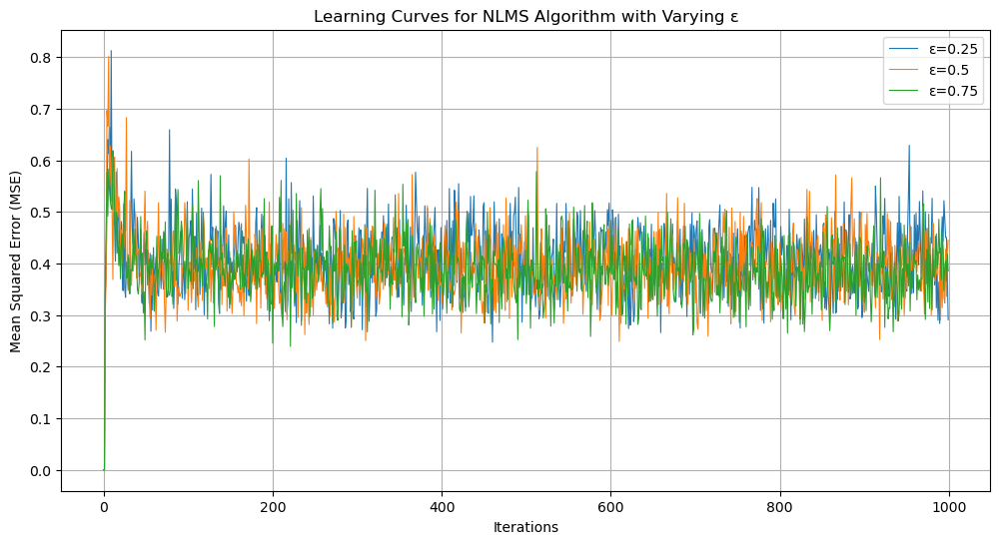

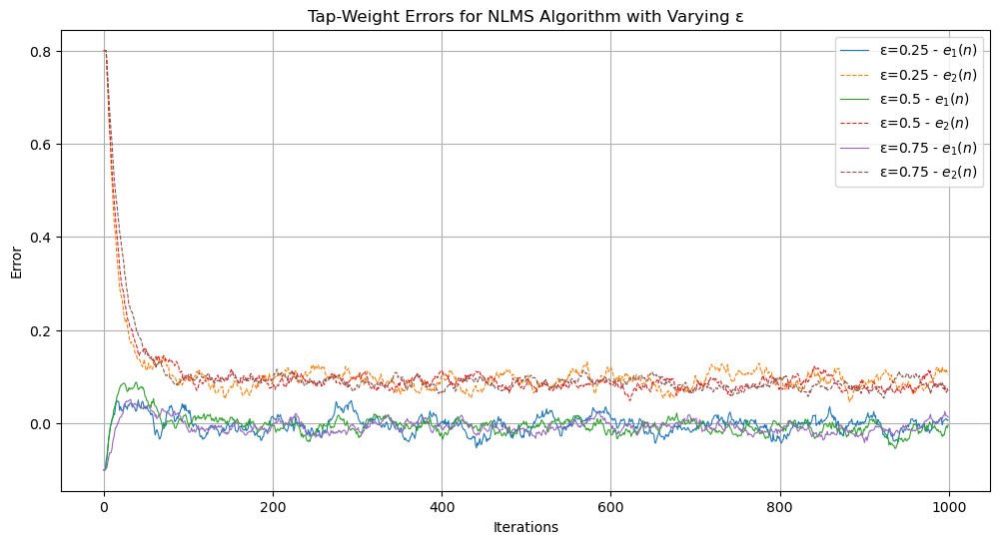

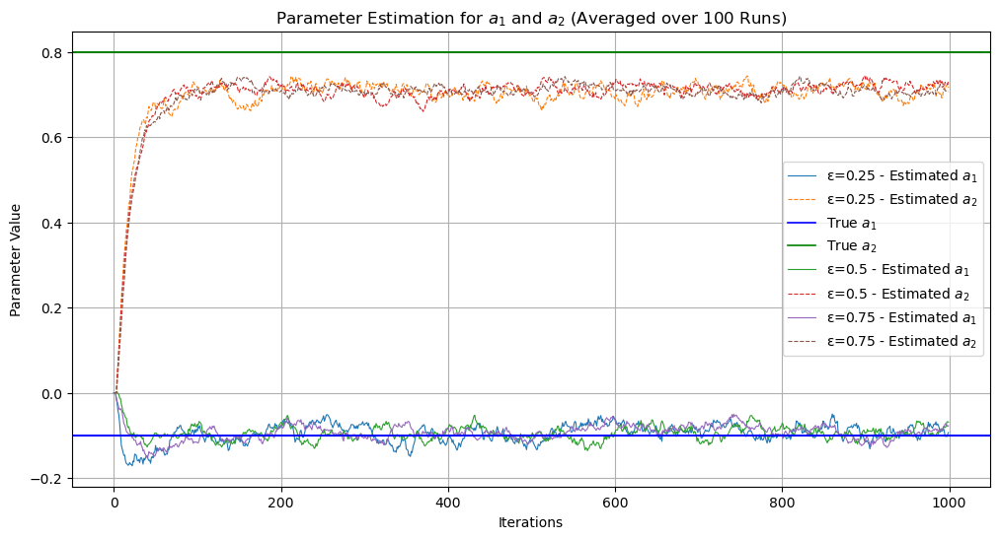

In [47]:
epsilon_values = [0.25, 0.5, 0.75]  # ε values for comparison
learning_curves_epsilon = {}  # Store learning curves for ε
tap_weight_errors_epsilon = {}  # Store tap-weight errors for ε

for epsilon in epsilon_values:  # Run simulations for each ε
    label = f"ε={epsilon}"  # Label for the current ε
    f, w = MC_simulation(a1, a2, sigma_v2, miu, epsilon, num_samples, num_runs)  # Run simulation
    learning_curves_epsilon[label] = f  # Store learning curve
    e1 = -a1 - w[:, 0]  # Error for a1
    e2 = -a2 - w[:, 1]  # Error for a2
    tap_weight_errors_epsilon[label] = (e1, e2)  # Store errors for both parameters

plt.figure(figsize=(12, 6))
for label, curve in learning_curves_epsilon.items():  # Plot learning curves
    plt.plot(curve, label=label, linewidth=0.8)
plt.title("Learning Curves for NLMS Algorithm with Varying ε")
plt.xlabel("Iterations")
plt.ylabel("Mean Squared Error (MSE)")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
for label, (e1, e2) in tap_weight_errors_epsilon.items():  # Plot tap-weight errors
    plt.plot(e1, label=f"{label} - $e_1(n)$", linewidth=0.8)
    plt.plot(e2, label=f"{label} - $e_2(n)$", linestyle="--", linewidth=0.8)
plt.title("Tap-Weight Errors for NLMS Algorithm with Varying ε")
plt.xlabel("Iterations")
plt.ylabel("Error")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
for epsilon in epsilon_values:  # Plot parameter estimation
    label = f"ε={epsilon}"
    _, w = MC_simulation(a1, a2, sigma_v2, miu, epsilon, num_samples, num_runs)  # Run simulation
    plt.plot(w[:, 0], label=f"{label} - Estimated $a_1$", linestyle="-", linewidth=0.8)
    plt.plot(w[:, 1], label=f"{label} - Estimated $a_2$", linestyle="--", linewidth=0.8)
    plt.axhline(y=-a1, color="blue", linestyle="-", linewidth=1.2, label="True $a_1$" if epsilon == epsilon_values[0] else None)
    plt.axhline(y=-a2, color="green", linestyle="-", linewidth=1.2, label="True $a_2$" if epsilon == epsilon_values[0] else None)
plt.title("Parameter Estimation for $a_1$ and $a_2$ (Averaged over 100 Runs)")
plt.xlabel("Iterations")
plt.ylabel("Parameter Value")
plt.grid(True)
plt.legend()
plt.show()

---
---

### Optional extra 2
# Experiment: Reproducing Results from Chapter 6.7 with LMS and NLMS

In this experiment, we repeated the results from **Chapter 6.7** using both **LMS** and **normalized LMS (NLMS)** algorithms. The parameters for the AR(1) process and algorithms were the same as in the original assignment. For NLMS, we used a normalization factor $\epsilon = 0.01$ for stability.

#### Observations:
1. **Figure 6.15**: Learning curves for LMS and NLMS with $\mu = 0.01, 0.05, 0.1$.  
   - Both algorithms showed faster convergence with larger $\mu$.  
   - NLMS converged slightly faster than LMS, especially for higher $\mu$, due to its ability to adapt to signal variations.

2. **Figure 6.16**: Transient response of tap weights.  
   - Both LMS and NLMS reached the correct Wiener solution ($-a$).  
   - NLMS converged faster than LMS because of its normalization.

3. **Figure 6.17**: Random behavior of tap weights after convergence.  
   - Both algorithms showed fluctuations around the Wiener solution.  
   - NLMS had smaller fluctuations, showing more stable performance.

4. **Figure 6.18**: Comparison of theoretical and experimental MSE for $\mu = 0.001$.  
   - Both LMS and NLMS closely followed the theoretical MSE curve.  
   - NLMS showed a slightly better match, handling signal energy changes more effectively.

---

#### Conclusion:
NLMS performs better than LMS in terms of speed and stability, especially with larger step sizes. For small step sizes, both algorithms perform similarly. This makes NLMS a good choice when dealing with signals that have varying amplitudes.

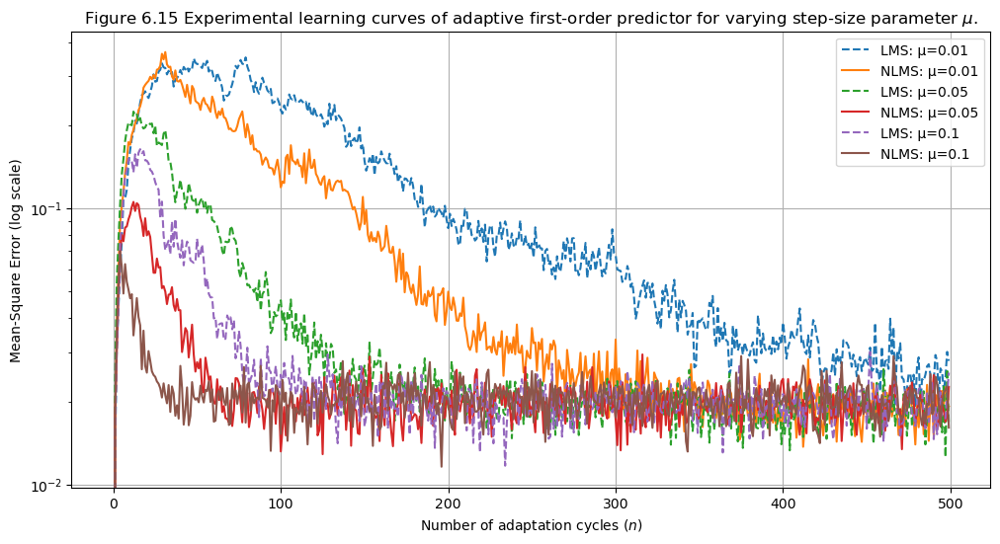

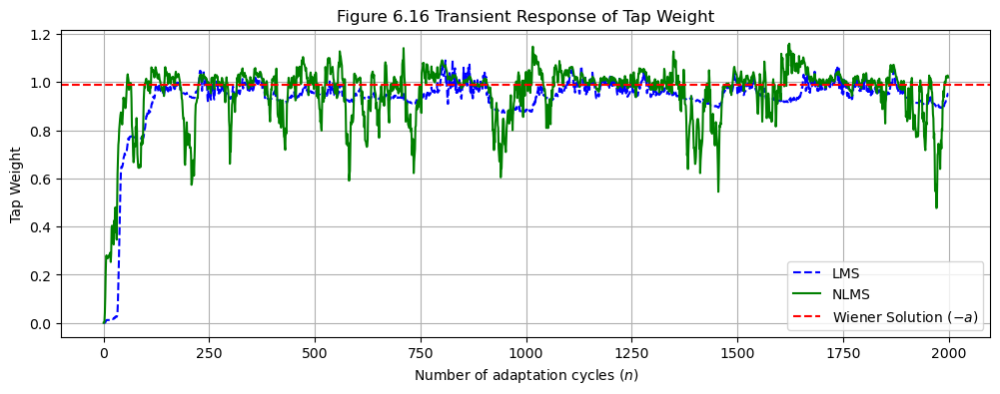

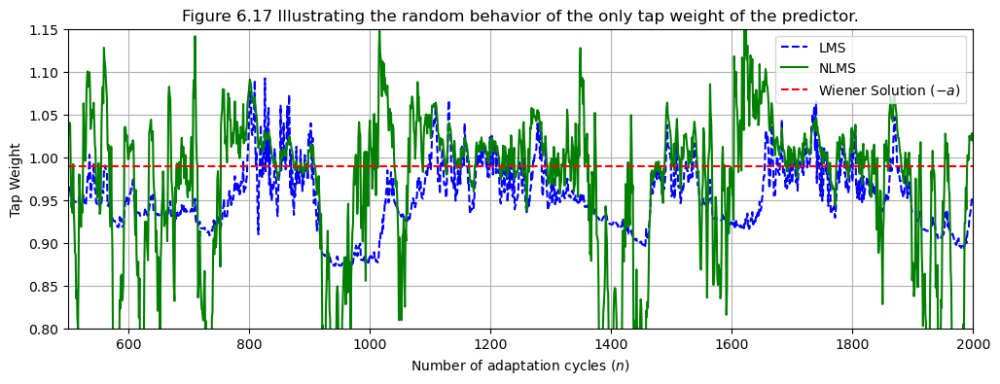

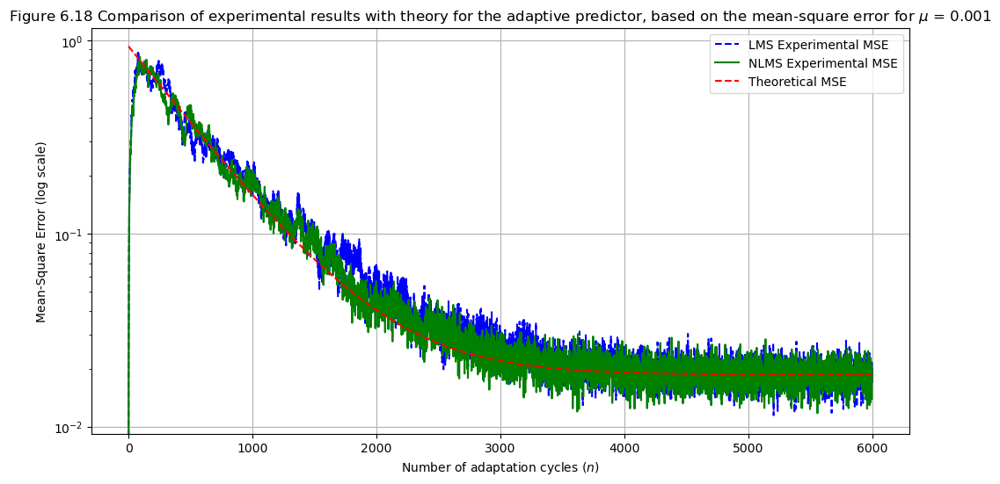

In [50]:
# Generate AR(1) process
def generate_ar_process(a, sigma_v2, num_samples):
    u = np.zeros(num_samples)
    v = np.random.normal(0, np.sqrt(sigma_v2), num_samples)
    for n in range(1, num_samples):
        u[n] = -a * u[n - 1] + v[n]
    return u

# LMS algorithm
def lms_for_prediction(u, miu, num_samples):
    w = np.zeros(num_samples + 1)
    f = np.zeros(num_samples)
    for n in range(1, num_samples):
        f[n] = u[n] - w[n] * u[n - 1]
        w[n + 1] = w[n] + miu * f[n] * u[n - 1]
    return w[1:], f

# NLMS algorithm
def nlms_for_prediction(u, miu, epsilon, num_samples):
    w = np.zeros(num_samples + 1)
    f = np.zeros(num_samples)
    for n in range(1, num_samples):
        norm_factor = u[n - 1]**2 + epsilon
        f[n] = u[n] - w[n] * u[n - 1]
        w[n + 1] = w[n] + (miu / norm_factor) * f[n] * u[n - 1]
    return w[1:], f

# Monte Carlo simulation
def MC_simulation(algorithm, miu_values, a, sigma_v2, num_samples, num_runs, epsilon=None):
    mse_curves = {}
    weight_curves = {}
    for miu in miu_values:
        mse_per_run = np.zeros((num_runs, num_samples))
        weight_per_run = np.zeros((num_runs, num_samples))
        for run in range(num_runs):
            u = generate_ar_process(a, sigma_v2, num_samples)
            if algorithm == "LMS":
                w, f = lms_for_prediction(u, miu, num_samples)
            elif algorithm == "NLMS":
                w, f = nlms_for_prediction(u, miu, epsilon, num_samples)
            mse_per_run[run] = f**2
            weight_per_run[run] = w
        mse_curves[miu] = np.mean(mse_per_run, axis=0)
        weight_curves[miu] = np.mean(weight_per_run, axis=0)
    return mse_curves, weight_curves

# Theoretical MSE for LMS
def theoretical_J(a, sigma_v2, miu, sigma_u2, num_samples):
    J = np.zeros(num_samples)
    for n in range(num_samples):
        steady_term = sigma_v2 * (1 + (miu / 2) * sigma_u2)
        transient_term = sigma_u2 * (a**2 - (miu / 2) * sigma_v2)
        exp_decay = (1 - miu * sigma_u2)**(2 * n)
        J[n] = steady_term + transient_term * exp_decay
    return J

# Parameters
a = -0.99
sigma_u2 = 0.936
sigma_v2 = sigma_u2 * (1 - a**2)
miu_values = [0.01, 0.05, 0.1]
num_samples = 500
num_runs = 100
epsilon = 0.01

# LMS Monte Carlo simulation
mse_curves_lms, weight_curves_lms = MC_simulation("LMS", miu_values, a, sigma_v2, num_samples, num_runs)

# NLMS Monte Carlo simulation
mse_curves_nlms, weight_curves_nlms = MC_simulation("NLMS", miu_values, a, sigma_v2, num_samples, num_runs, epsilon=epsilon)

# Plot Learning Curves (Figure 6.15)
plt.figure(figsize=(12, 6))
for miu in miu_values:
    plt.plot(mse_curves_lms[miu], label=f"LMS: μ={miu}", linestyle="--")
    plt.plot(mse_curves_nlms[miu], label=f"NLMS: μ={miu}", linestyle="-")
plt.yscale("log")
plt.title(r"Figure 6.15 Experimental learning curves of adaptive first-order predictor for varying step-size parameter $\mu$.")
plt.xlabel("Number of adaptation cycles ($n$)")
plt.ylabel("Mean-Square Error (log scale)")
plt.grid()
plt.legend()
plt.show()

# Transient Response of Tap Weight (Figure 6.16)
u = generate_ar_process(a, sigma_v2, 2000)
w_history_lms, _ = lms_for_prediction(u, 0.1, 2000)
w_history_nlms, _ = nlms_for_prediction(u, 0.1, epsilon, 2000)

plt.figure(figsize=(12, 4))
plt.plot(w_history_lms, label="LMS", linestyle="--", color="blue")
plt.plot(w_history_nlms, label="NLMS", linestyle="-", color="green")
plt.axhline(-a, color="red", linestyle="--", label="Wiener Solution ($-a$)")
plt.title("Figure 6.16 Transient Response of Tap Weight")
plt.xlabel("Number of adaptation cycles ($n$)")
plt.ylabel("Tap Weight")
plt.grid()
plt.legend()
plt.show()

# Random Behavior of Tap Weight (Figure 6.17)
plt.figure(figsize=(12, 4))
plt.plot(w_history_lms, label="LMS", linestyle="--", color="blue")
plt.plot(w_history_nlms, label="NLMS", linestyle="-", color="green")
plt.axhline(-a, color="red", linestyle="--", label="Wiener Solution ($-a$)")
plt.xlim(500, 2000)
plt.ylim(0.8, 1.15)
plt.title("Figure 6.17 Illustrating the random behavior of the only tap weight of the predictor.")
plt.xlabel("Number of adaptation cycles ($n$)")
plt.ylabel("Tap Weight")
plt.grid()
plt.legend()
plt.show()

# Theoretical vs Experimental MSE (Figure 6.18)
miu = 0.001
num_samples = 6000
theoretical_J_curve = theoretical_J(a, sigma_v2, miu, sigma_u2, num_samples)
mse_experiment_lms, _ = MC_simulation("LMS", [miu], a, sigma_v2, num_samples, num_runs)
mse_experiment_nlms, _ = MC_simulation("NLMS", [miu], a, sigma_v2, num_samples, num_runs, epsilon=epsilon)

plt.figure(figsize=(12, 6))
plt.plot(mse_experiment_lms[miu], label="LMS Experimental MSE", linestyle="--", color="blue")
plt.plot(mse_experiment_nlms[miu], label="NLMS Experimental MSE", linestyle="-", color="green")
plt.plot(theoretical_J_curve, label="Theoretical MSE", linestyle="--", color="red")
plt.yscale("log")
plt.title(r"Figure 6.18 Comparison of experimental results with theory for the adaptive predictor, based on the mean-square error for $\mu$ = 0.001")
plt.xlabel("Number of adaptation cycles ($n$)")
plt.ylabel("Mean-Square Error (log scale)")
plt.grid()
plt.legend()
plt.show()
